In [1]:
library("Matrix")
library(Seurat)
library(DT)
library(dplyr)
library(here)
library(ggplot2)
library(mclust)
library(cowplot)
library(tidyverse)
library(reshape)
library(SingleR)
library(annotate)
library("org.Mm.eg.db")
library(biomaRt)
library(scCustomize)
library(future)
library(ggnewscale)
library(furrr)
library(readxl)
library(STACAS)
library(patchwork)

rank_score_func <- function(df){

df <- df %>% mutate(score = -1*log(p_val_adj+(10^-310))*avg_logFC*(pct.1/(pct.2+10^-300)))

return(df)
}

convertHumanGeneList <- function(x){

require("biomaRt")
human = useMart("ensembl", dataset = "hsapiens_gene_ensembl")
mouse = useMart("ensembl", dataset = "mmusculus_gene_ensembl")

genesV2 = getLDS(attributes = c("hgnc_symbol"), filters = "hgnc_symbol", values = x , mart = human, attributesL = c("mgi_symbol"), martL = mouse, uniqueRows=T)

humanx <- unique(genesV2[, 2])

# Print the first 6 genes found to the screen
print(head(humanx))
return(humanx)
}

library("remotes")
library("fs")

ggtheme <- function() {
  theme(
    axis.text = element_text(size = 10),
    axis.title = element_text(size = 10),
      plot.title = element_text(size = 10),
    text = element_text(size = 10, colour = "black"),
    legend.text = element_text(size = 10),
    legend.key.size =  unit(10, units = "points")
    
  )
}

mid.se <- celldex::MonacoImmuneData();

The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, will retire in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.
The sp package is now running under evolution status 2
     (status 2 uses the sf package in place of rgdal)

Attaching SeuratObject


Attaching package: 'DT'


The following object is masked from 'package:SeuratObject':

    JS


The following object is masked from 'package:Seurat':

    JS



Attaching package: 'dplyr'


The following objects are masked from 'package:stats':

    filter, lag


The following objects are masked from 'package:base':

    intersect, setdiff, setequal, union


here() starts at /auto/brno2/home/vercanie/DIA

Package 'mclust' version 5.4.8
Type 'citation("mclust")' for citing this R package in publica

In [2]:
plan("multisession")

# All diabetes data - new and old

## CD4 new

In [3]:
paths  <- list.files("data/rawdata/", full.names = T)

In [4]:
paths

[1] "data/rawdata//exp08_init_with_Mixcr.rds"      
 [2] "data/rawdata//exp10_init_with_Mixcr.rds"      
 [3] "data/rawdata//exp11_W1_init_with_Mixcr.rds"   
 [4] "data/rawdata//exp11_W2_init_with_Mixcr.rds"   
 [5] "data/rawdata//exp16_CD4_A_init_with_Mixcr.rds"
 [6] "data/rawdata//exp16_CD4_B_init_with_Mixcr.rds"
 [7] "data/rawdata//exp16_CD8_A_init_with_Mixcr.rds"
 [8] "data/rawdata//exp16_CD8_B_init_with_Mixcr.rds"
 [9] "data/rawdata//exp18_1_init_with_Mixcr.rds"    
[10] "data/rawdata//exp18_2_init_with_Mixcr.rds"    
[11] "data/rawdata//exp18_3_init_with_Mixcr.rds"    
[12] "data/rawdata//exp18_4_init_with_Mixcr.rds"    
[13] "data/rawdata//exp19_1_init_with_Mixcr.rds"    
[14] "data/rawdata//exp19_2_init_with_Mixcr.rds"    
[15] "data/rawdata//exp19_3_init_with_Mixcr.rds"    
[16] "data/rawdata//exp19_4_init_with_Mixcr.rds"    
[17] "data/rawdata//exp20_1_init_with_Mixcr.rds"    
[18] "data/rawdata//exp20_2_init_with_Mixcr.rds"    
[19] "data/rawdata//exp20_3_init_with_Mixcr.rds"    
[20] "data/rawdata//exp20_4_init_with_Mixcr.rds"

In [5]:
seu_list  <- map(paths[c(2,4,5,6,10,12,14,16,18,20)], readRDS)

In [6]:
seu_list[[1]]$hashtags  %>% table

.
 H1 H10  H2  H3  H4  H5  H6  H7  H8  H9 
743 831 821 762 825 695 821 761 787 802 

In [7]:
exp10_cd4  <- subset(seu_list[[1]], hashtags != "H5")

In [8]:
seu_list[[1]] <- exp10_cd4

In [9]:
seu_list[[1]]$Condition  %>% table

.
Ctrl T0  Dia T0 
   2326    4827 

In [10]:
new_dia_cd4  <- scCustomize::Merge_Seurat_List(seu_list)

Warning message in CheckDuplicateCellNames(object.list = objects):
"Some cell names are duplicated across objects provided. Renaming to enforce unique cell names."
Warning message in CheckDuplicateCellNames(object.list = objects):
"Some cell names are duplicated across objects provided. Renaming to enforce unique cell names."
Warning message in CheckDuplicateCellNames(object.list = objects):
"Some cell names are duplicated across objects provided. Renaming to enforce unique cell names."
Warning message in CheckDuplicateCellNames(object.list = objects):
"Some cell names are duplicated across objects provided. Renaming to enforce unique cell names."
Warning message in CheckDuplicateCellNames(object.list = objects):
"Some cell names are duplicated across objects provided. Renaming to enforce unique cell names."


In [11]:
new_dia_cd4

An object of class Seurat 
15427 features across 98852 samples within 3 assays 
Active assay: RNA (15413 features, 0 variable features)
 2 other assays present: Antibodies, PTPRC

### Remove problematic Patient 206

In [12]:
new_dia_cd4  <- subset(new_dia_cd4, Patient_ID != "206")

In [13]:
options(future.globals.maxSize = 10000 * 1024^2)
plan("sequential")

In [14]:
DefaultAssay(new_dia_cd4)  <- "RNA"
new_dia_cd4 <- NormalizeData(new_dia_cd4, verbose = FALSE)
new_dia_cd4 <- ScaleData(new_dia_cd4, verbose = FALSE)
new_dia_cd4 <- FindVariableFeatures(new_dia_cd4, nfeatures = 1000, verbose = FALSE)
new_dia_cd4 <- RunPCA(new_dia_cd4, npcs = 12, verbose = FALSE)
new_dia_cd4 <- RunUMAP(new_dia_cd4, reduction = "pca", dims = 1:12)

Warning message:
"The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session"
15:48:32 UMAP embedding parameters a = 0.9922 b = 1.112

15:48:32 Read 98426 rows and found 12 numeric columns

15:48:32 Using Annoy for neighbor search, n_neighbors = 30

15:48:32 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

15:48:41 Writing NN index file to temp file /var/tmp/pbs.18208175.meta-pbs.metacentrum.cz/RtmpLWriwE/filedff3b4975935

15:48:41 Searching Annoy index using 1 thread, search_k = 3000

15:49:21 Annoy recall = 100%

15:49:22 Commencing smooth kNN distance calibration

In [15]:
new_dia_cd4 <- FindNeighbors(new_dia_cd4, dims = 1:12)
new_dia_cd4 <- FindClusters(new_dia_cd4, resolution = 1)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 98426
Number of edges: 2579756

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8280
Number of communities: 23
Elapsed time: 57 seconds


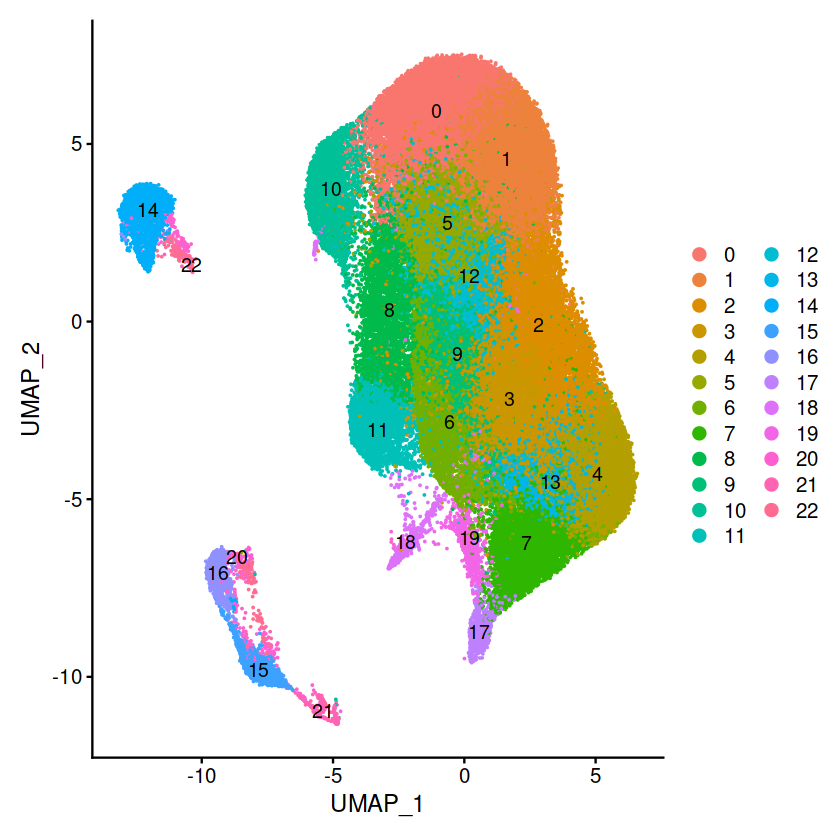

In [16]:
DimPlot(new_dia_cd4, label = T)

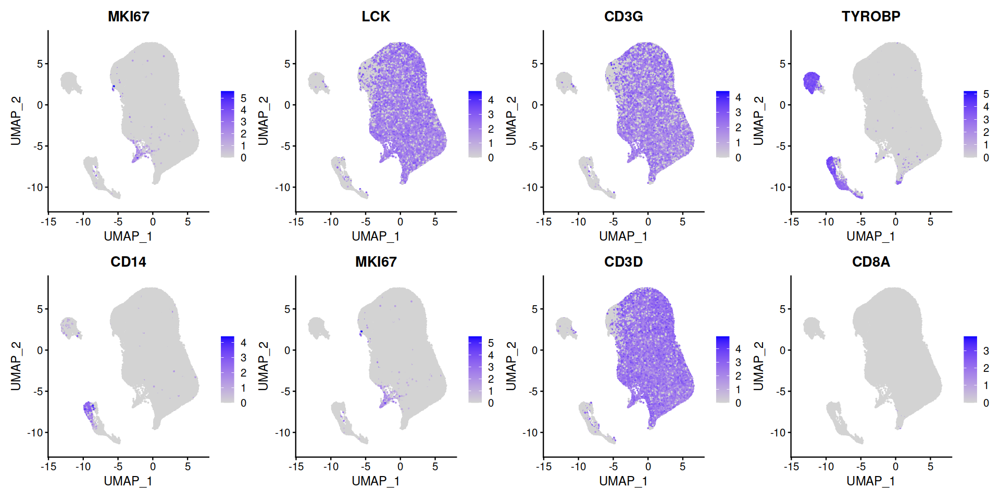

In [17]:
options(repr.plot.width = 16, repr.plot.height = 8)
FeaturePlot(new_dia_cd4, features = c("MKI67", "LCK", "CD3G", "TYROBP", "CD14", "MKI67", "CD3D", "CD8A"), ncol = 4)

### Automated annotation of cell types

In [18]:
library(Azimuth)
mid.se <- celldex::MonacoImmuneData()
hpca.se  <- celldex::HumanPrimaryCellAtlasData()
load("data/ref_wherry_new.RData")

Registered S3 method overwritten by 'SeuratDisk':
  method            from  
  as.sparse.H5Group Seurat

Attaching shinyBS

snapshotDate(): 2020-10-27

see ?celldex and browseVignettes('celldex') for documentation

loading from cache

see ?celldex and browseVignettes('celldex') for documentation

loading from cache

snapshotDate(): 2020-10-27

see ?celldex and browseVignettes('celldex') for documentation

downloading 1 resources

retrieving 1 resource

loading from cache

see ?celldex and browseVignettes('celldex') for documentation

downloading 1 resources

retrieving 1 resource

loading from cache



In [19]:
annotate_tcell_data  <- function(seurat_dataset){
    
    ## This function annotates a Seurat object with three annotations:
    ## 1. Monaco Immune dataset annotations
    ## 2. Annotations based on bulk RNAseq from Giles et al, 2022
    ## 3. Azimuth annotations
        
    DefaultAssay(seurat_dataset)  <- "RNA"
	
    ### Annotate the dataset with Monaco Immune dataset
		pred.singler <- SingleR(test = seurat_dataset@assays$RNA@counts, ref = mid.se, assay.type.test=1,
		labels = mid.se$label.fine, fine.tune = F)
    
	### Annotate the dataset with Wherry dataset
        pred.singler2 <- SingleR(test = seurat_dataset@assays$RNA@counts, ref = ref_wherry_new$matrix,
		labels = ref_wherry_new$labels, fine.tune = F)

    	### Annotate the dataset with Wherry dataset
        pred.singler3 <- SingleR(test = seurat_dataset@assays$RNA@counts, ref = hpca.se,
		assay.type.test=1,
		labels = hpca.se$label.fine, fine.tune = F)

		all_labels <- data.frame(
		Monaco_single = pred.singler$labels,
		HPCA_single = pred.singler3$labels,
		Wherry_main = pred.singler2$labels,
		barcode = colnames(seurat_dataset))
		
		md2 <- seurat_dataset@meta.data
		md2$barcode = colnames(seurat_dataset)

		md3 <- left_join(md2, all_labels)

		seurat_dataset@meta.data <- md3
		rownames(seurat_dataset@meta.data) <- colnames(seurat_dataset)
		
	### Annotate the dataset with Azimuth
		
		seurat_dataset <- RunAzimuth(seurat_dataset, reference = "pbmcref")
		return(seurat_dataset)
	}


new_dia_cd4  <- annotate_tcell_data(new_dia_cd4)

Joining with `by = join_by(barcode)`


An AzimuthData object - reference version: 1.0.0 
Contains 3 meta.data field(s) to transfer.

Warning message:
"Overwriting miscellanous data for model"
detected inputs from HUMAN with id type Gene.name

reference rownames detected HUMAN with id type Gene.name

Using reference SCTModel to calculate pearson residuals

Determine variable features

Setting min_variance to:  -Inf

Calculating residuals of type pearson for 3918 genes



  |======================================================================| 100%


Set default assay to refAssay

Normalizing query using reference SCT model

Projecting cell embeddings

Finding query neighbors

Finding neighborhoods

Finding anchors

	Found 9292 anchors

Finding integration vectors

Finding integration vector weights

Predicting cell labels

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from predictionscorecelltype.l1_ to predictionscorecelltypel1_"
Predicting cell labels

Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from predictionscorecelltype.l2_ to predictionscorecelltypel2_"
Predicting cell labels

Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from predictionscorecelltype.l3_ to p

In [20]:
saveRDS(new_dia_cd4, "data/processed/cd4_full.rds")

In [21]:
new_dia_cd4  <- readRDS("data/processed/cd4_full.rds")

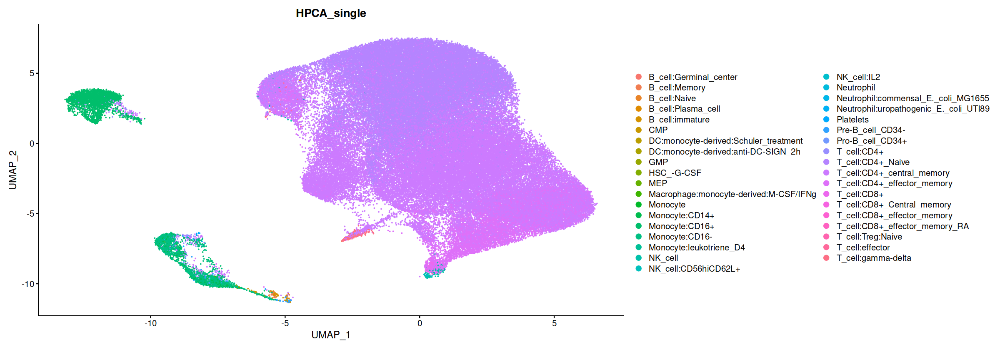

In [22]:
options(repr.plot.width = 20, repr.plot.height = 7)

DimPlot(new_dia_cd4, raster = F, group.by = "HPCA_single", label = F)
p1  <- DimPlot(new_dia_cd4, raster = F, group.by = "HPCA_single", label = F)

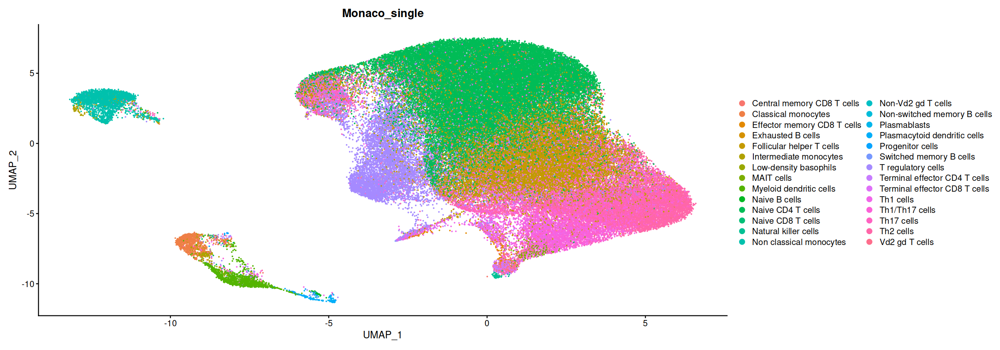

In [23]:
DimPlot(new_dia_cd4, raster = F, group.by = "Monaco_single", label = F)

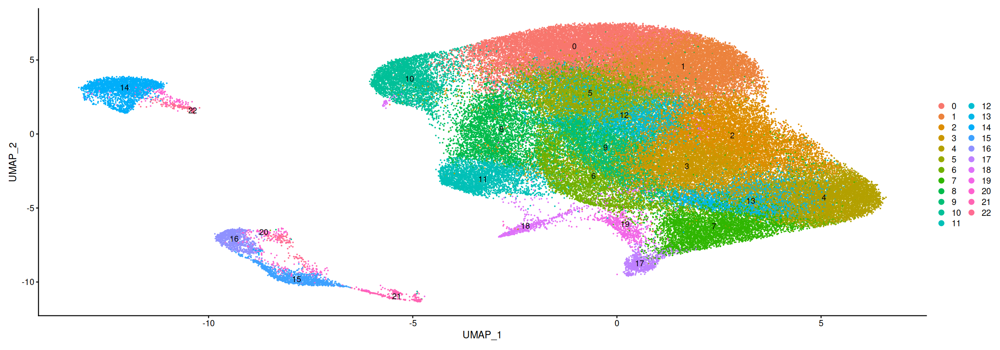

In [24]:
DimPlot(new_dia_cd4, label = T, raster = F)


### Remove contaminating cells

In [25]:
new_dia_cd4  <- subset(new_dia_cd4, seurat_clusters %in% c(0:13,17:19))

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from ref.umap_ to refumap_"


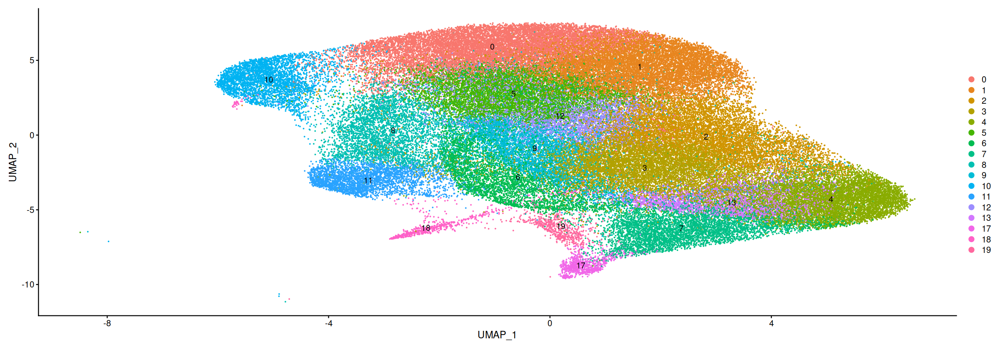

In [26]:
DimPlot(new_dia_cd4, label = T, raster = F)

In [27]:
DefaultAssay(new_dia_cd4)  <- "RNA"
new_dia_cd4 <- NormalizeData(new_dia_cd4, verbose = FALSE)

new_dia_cd4 <- ScaleData(new_dia_cd4, verbose = FALSE)
new_dia_cd4 <- FindVariableFeatures(new_dia_cd4, nfeatures = 1000, verbose = FALSE)
new_dia_cd4 <- RunPCA(new_dia_cd4, npcs = 12, verbose = FALSE)
new_dia_cd4 <- RunUMAP(new_dia_cd4, reduction = "pca", dims = 1:12)

new_dia_cd4 <- FindNeighbors(new_dia_cd4, dims = 1:12)
new_dia_cd4 <- FindClusters(new_dia_cd4, resolution = 1)

16:29:01 UMAP embedding parameters a = 0.9922 b = 1.112

16:29:01 Read 92673 rows and found 12 numeric columns

16:29:01 Using Annoy for neighbor search, n_neighbors = 30

16:29:01 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

16:29:09 Writing NN index file to temp file /var/tmp/pbs.18208175.meta-pbs.metacentrum.cz/RtmpLWriwE/filedff3b56e4bc22

16:29:09 Searching Annoy index using 1 thread, search_k = 3000

16:29:46 Annoy recall = 100%

16:29:47 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

16:29:49 Initializing from normalized Laplacian + noise (using irlba)

16:29:51 Commencing optimization for 200 epochs, with 3927002 positive edges

16:30:22 Optimization finished

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 92673
Number of edges: 2320392

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8147
Number of communities: 18
Elapsed time: 41 seconds


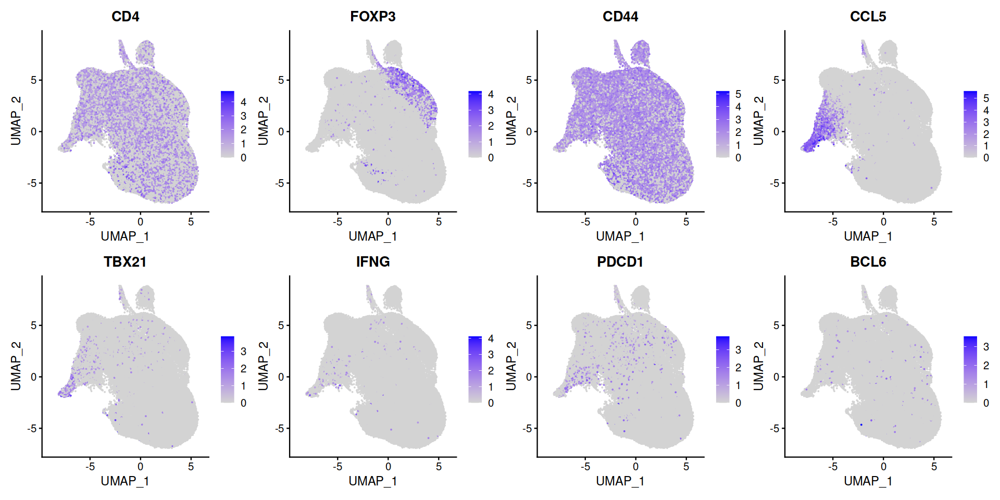

In [28]:
options(repr.plot.width = 16, repr.plot.height = 8)

FeaturePlot(new_dia_cd4, features = c("CD4", "FOXP3", "CD44", "CCL5", "TBX21", "IFNG", "PDCD1", "BCL6"), ncol = 4)

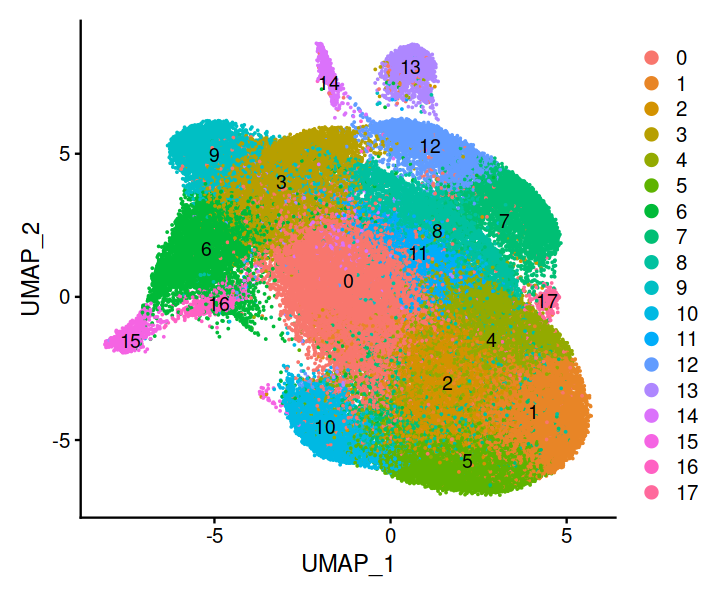

In [29]:
options(repr.plot.width = 6, repr.plot.height = 5)
DimPlot(new_dia_cd4, label = T)

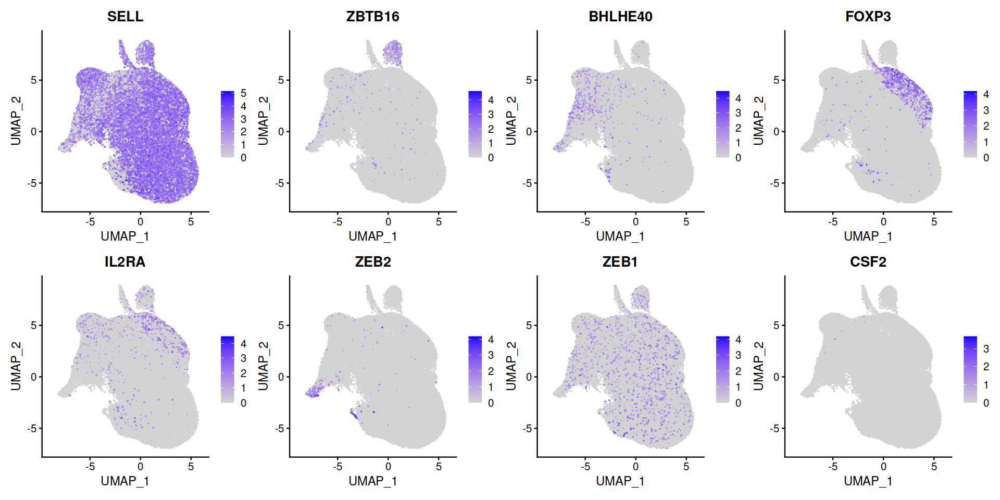

In [30]:
options(repr.plot.width = 16, repr.plot.height = 8)

FeaturePlot(new_dia_cd4, features = c("SELL", "ZBTB16", "BHLHE40", "FOXP3", "IL2RA", "ZEB2", "ZEB1", "CSF2"), ncol = 4)

In [31]:
new_dia_cd4@meta.data  <- new_dia_cd4@meta.data  %>% separate(Condition, into = c("Disease", "Time"), remove = F, sep = " ")

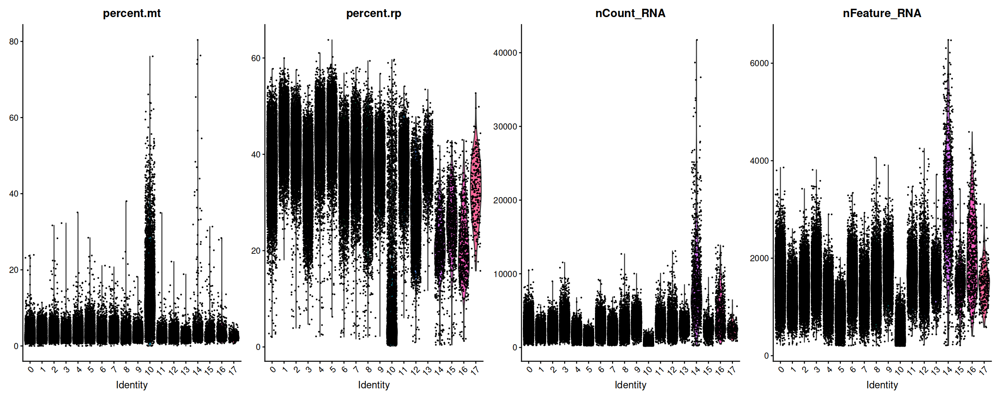

In [32]:
options(repr.plot.width = 20)
VlnPlot(new_dia_cd4, features = c("percent.mt", "percent.rp", "nCount_RNA", "nFeature_RNA"), ncol = 4)

### Remove dead cells

In [33]:
cutoff_nFeature_RNA <- 500
cutoff_percent_mt <- 10
cluster_exclude <- c(10)

In [34]:
p1 <- ggplot(data.frame(nCount_RNA = new_dia_cd4$nCount_RNA,
                  nFeature_RNA = new_dia_cd4$nFeature_RNA,
                  percent_mt = new_dia_cd4$percent.mt,
                  seurat_clusters = new_dia_cd4$seurat_clusters,
                  exclude = ifelse(new_dia_cd4$seurat_clusters %in% cluster_exclude, TRUE, FALSE)), 
       aes(x = seurat_clusters, y = percent_mt)) +
  geom_violin(scale = "width", aes(fill = exclude)) + 
  geom_hline(yintercept = cutoff_percent_mt,
               geom = "line", 
               width = 0.5,
               colour = "red") + 
  ggtitle("Percent mt. cutoff") + 
  theme_classic() +
  scale_fill_manual(values = c("white","red")) +
  theme(panel.background = element_blank(), 
        axis.text.x = element_text(angle = 0, hjust = 1)) +
  annotate(geom = "rect", xmin = min(as.numeric(new_dia_cd4$seurat_clusters))-1, 
           xmax = max(as.numeric(new_dia_cd4$seurat_clusters))+1, 
           ymin=cutoff_percent_mt,ymax=1.1*(max(new_dia_cd4$percent.mt)), fill = "red", alpha = 0.1)

p2 <- ggplot(data.frame(nCount_RNA = new_dia_cd4$nCount_RNA,
                  nFeature_RNA = new_dia_cd4$nFeature_RNA,
                  percent_mt = new_dia_cd4$percent.mt,
                  seurat_clusters = new_dia_cd4$seurat_clusters,
                        exclude = ifelse(new_dia_cd4$seurat_clusters %in% cluster_exclude, TRUE, FALSE)), 
       aes(x = seurat_clusters, y = nFeature_RNA)) +
  geom_violin(scale = "width", aes(fill = exclude)) + 
  geom_hline(yintercept = cutoff_nFeature_RNA,
               geom = "line", 
               width = 0.5,
               colour = "red") + 
  ggtitle("nFeature RNA cutoff") + 
  theme_classic() +
  scale_fill_manual(values = c("white","red")) +
  theme(panel.background = element_blank(), 
        axis.text.x = element_text(angle = 0, hjust = 1)) +
  annotate(geom = "rect", xmin = min(as.numeric(new_dia_cd4$seurat_clusters))-1, 
           xmax = max(as.numeric(new_dia_cd4$seurat_clusters))+1, 
           ymin=0, ymax=cutoff_nFeature_RNA, fill = "red", alpha = 0.1)

Warning message in geom_hline(yintercept = cutoff_percent_mt, geom = "line", width = 0.5, :
"Ignoring unknown parameters: `geom` and `width`"
Warning message in geom_hline(yintercept = cutoff_nFeature_RNA, geom = "line", width = 0.5, :
"Ignoring unknown parameters: `geom` and `width`"


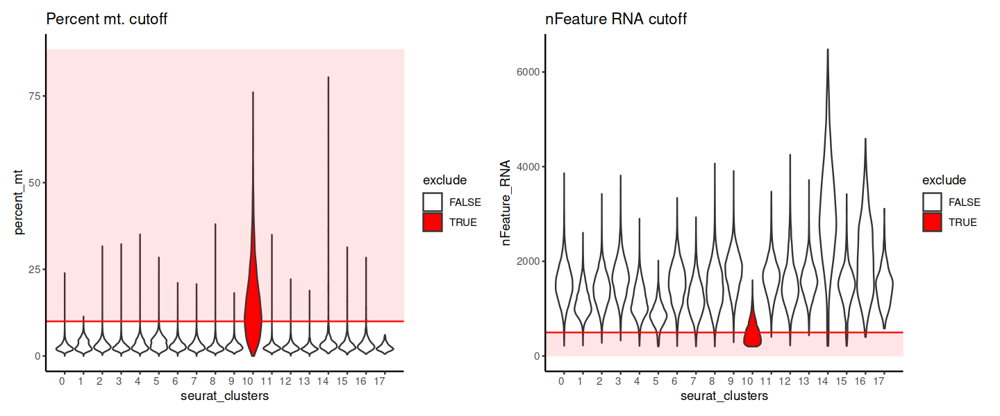

In [35]:
options(repr.plot.width = 12, repr.plot.height = 5)
p1 + p2

In [36]:
new_dia_cd4  <- subset(new_dia_cd4, 
                       ((seurat_clusters %in% cluster_exclude) == F) &
                      percent.mt < cutoff_percent_mt &
                      nFeature_RNA > cutoff_nFeature_RNA)

In [37]:
new_dia_cd4 <- NormalizeData(new_dia_cd4, verbose = FALSE)

new_dia_cd4 <- ScaleData(new_dia_cd4, verbose = FALSE)
new_dia_cd4 <- FindVariableFeatures(new_dia_cd4, nfeatures = 1000, verbose = FALSE)
new_dia_cd4 <- RunPCA(new_dia_cd4, npcs = 12, verbose = FALSE)
new_dia_cd4 <- RunUMAP(new_dia_cd4, reduction = "pca", dims = 1:12)

new_dia_cd4 <- FindNeighbors(new_dia_cd4, dims = 1:12)
new_dia_cd4 <- FindClusters(new_dia_cd4, resolution = 1)

16:32:44 UMAP embedding parameters a = 0.9922 b = 1.112

16:32:44 Read 87559 rows and found 12 numeric columns

16:32:44 Using Annoy for neighbor search, n_neighbors = 30

16:32:44 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

16:32:52 Writing NN index file to temp file /var/tmp/pbs.18208175.meta-pbs.metacentrum.cz/RtmpLWriwE/filedff3b433b47ad

16:32:52 Searching Annoy index using 1 thread, search_k = 3000

16:33:26 Annoy recall = 100%

16:33:28 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

16:33:31 Initializing from normalized Laplacian + noise (using irlba)

16:33:33 Commencing optimization for 200 epochs, with 3668348 positive edges

16:34:02 Optimization finished

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 87559
Number of edges: 2203185

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8104
Number of communities: 19
Elapsed time: 37 seconds


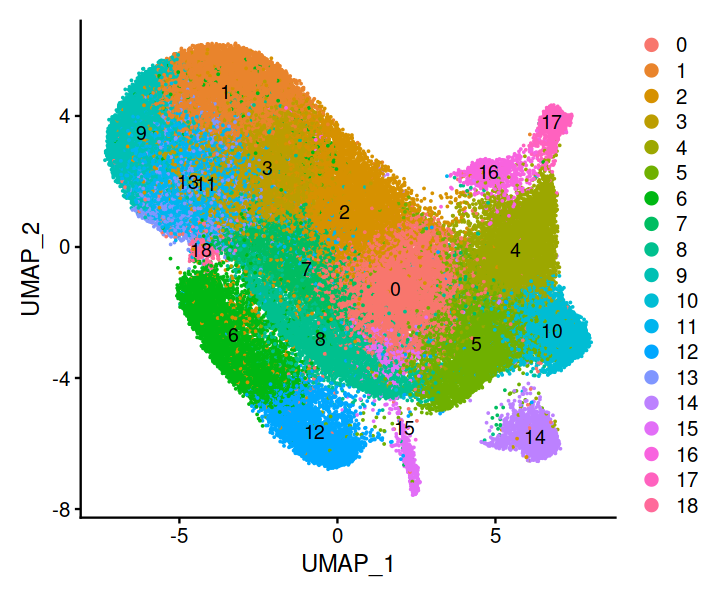

In [38]:
options(repr.plot.width = 6, repr.plot.height = 5)
DimPlot(new_dia_cd4, label = T)

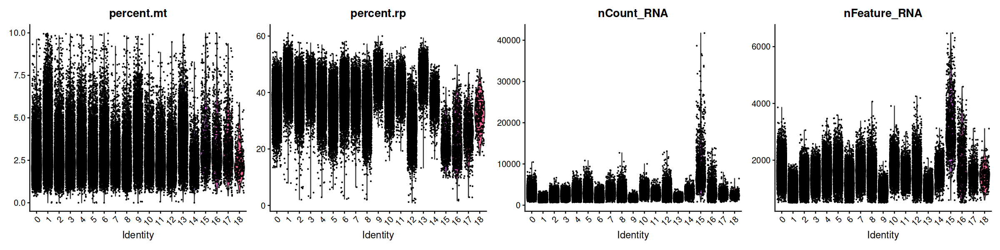

In [39]:
options(repr.plot.width = 20)
VlnPlot(new_dia_cd4, features = c("percent.mt", "percent.rp", "nCount_RNA", "nFeature_RNA"), ncol = 4)

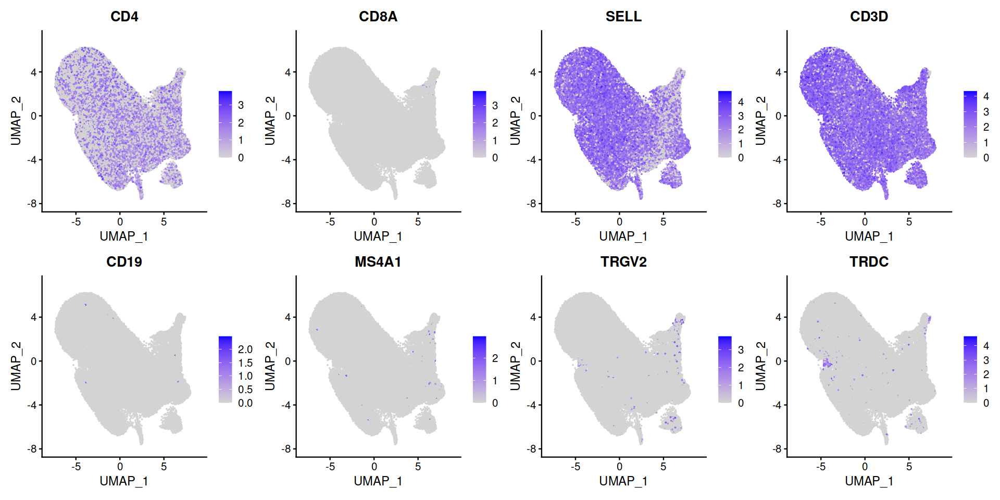

In [40]:
options(repr.plot.width = 16, repr.plot.height = 8)

FeaturePlot(new_dia_cd4, features = c("CD4", "CD8A", "SELL", "CD3D", "CD19", "MS4A1", "TRGV2", "TRDC"), ncol = 4)

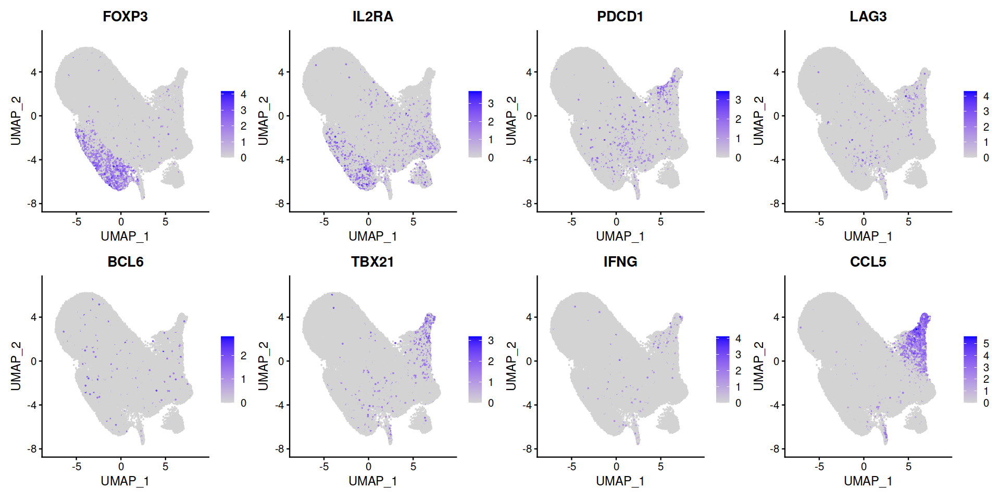

In [41]:
options(repr.plot.width = 16, repr.plot.height = 8)

FeaturePlot(new_dia_cd4, features = c("FOXP3", "IL2RA", "PDCD1", "LAG3", "BCL6", "TBX21", "IFNG", "CCL5"), ncol = 4)

Warning message:
"Could not find PTPRC-RA in the default search locations, found in PTPRC assay instead"
Warning message:
"Could not find PTPRC-RO in the default search locations, found in PTPRC assay instead"


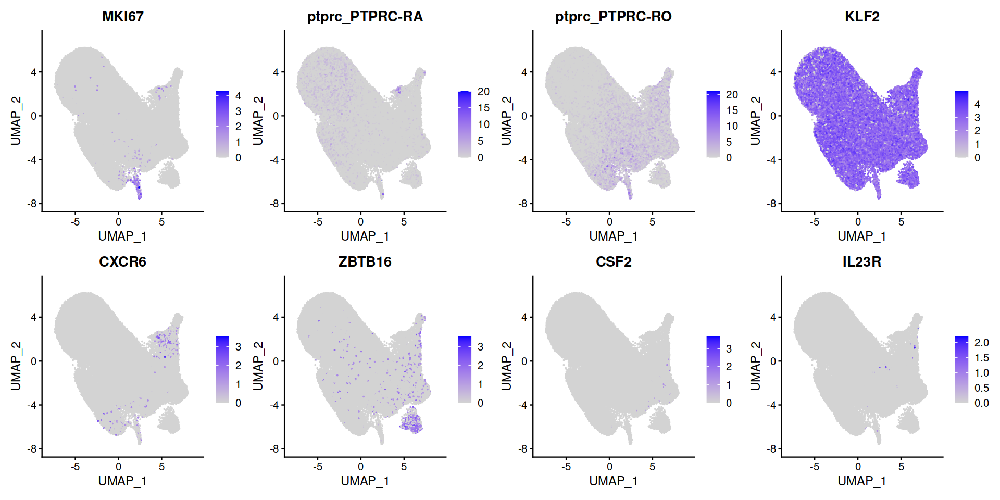

In [42]:
options(repr.plot.width = 16, repr.plot.height = 8)

FeaturePlot(new_dia_cd4, features = c("MKI67", "PTPRC-RA", "PTPRC-RO", "KLF2", "CXCR6", "ZBTB16", "CSF2", "IL23R"), ncol = 4)

In [43]:
new_dia_cd4@meta.data  %>% colnames

[1] "orig.ident"                  "nCount_RNA"                 
 [3] "nFeature_RNA"                "percent.mt"                 
 [5] "percent.rp"                  "nCount_Antibodies"          
 [7] "nFeature_Antibodies"         "hashtags"                   
 [9] "Experiment_ID"               "Prepared_by"                
[11] "Sample_ID"                   "Well"                       
[13] "Hashtag"                     "Hashtag_sequence"           
[15] "Hashtag_cat_n"               "Hashtag_dilution"           
[17] "Project.code"                "Well_CT_ID"                 
[19] "Condition"                   "Disease"                    
[21] "Time"                        "Species"                    
[23] "Age"                         "Age_group"                  
[25] "Sex"                         "Library_code"               
[27] "Patient_ID"                  "is_cell"                    
[29] "chain"                       "contig_id"                  
[31] "high_confidence"             "productive"                 
[33] "length"                      "reads"                      
[35] "umis"                        "vdj_source"                 
[37] "count_TRA"                   "count_TRB"                  
[39] "count_Multi"                 "cdr3_A1"                    
[41] "cdr3_A1_nt"                  "cdr3_A2"                    
[43] "cdr3_A2_nt"                  "cdr3_B"                     
[45] "cdr3_B_nt"                   "cdr3_Multi"                 
[47] "cdr3_Multi_nt"               "v_gene_A1"                  
[49] "j_gene_A1"                   "v_gene_A2"                  
[51] "j_gene_A2"                   "v_gene_B"                   
[53] "d_gene_B"                    "j_gene_B"                   
[55] "v_gene_Multi"                "d_gene_Multi"               
[57] "j_gene_Multi"                "clonotypes"                 
[59] "has.VDJ"                     "has.complete.VDJ"           
[61] "nCount_PTPRC"                "nFeature_PTPRC"             
[63] "RNA_snn_res.0.5"             "seurat_clusters"            
[65] "clonotype.repeated"          "RNA_snn_res.1"              
[67] "barcode"                     "Monaco_single"              
[69] "HPCA_single"                 "Wherry_main"                
[71] "nCount_refAssay"             "nFeature_refAssay"          
[73] "predicted.celltype.l1.score" "predicted.celltype.l1"      
[75] "predicted.celltype.l2.score" "predicted.celltype.l2"      
[77] "predicted.celltype.l3.score" "predicted.celltype.l3"      
[79] "mapping.score"

In [44]:
new_dia_cd4$Experiment_ID  %>% table

.
Exp10 Exp11 Exp16 Exp18 Exp19 Exp20 
 6864  6772 14050 24451 19954 15468 

In [45]:
new_dia_cd4$Condition  %>% table

.
   Ctrl T0    Ctrl T1     Dia T0     Dia T1 Pre-Dia T0 
     16601       4158      38400      25910       2490 

In [46]:
new_dia_cd4@meta.data  <- new_dia_cd4@meta.data  %>% separate(Condition, into = c("Disease", "Time"), remove = F, sep = " ")

In [47]:
new_dia_cd4$Time  <- if_else(is.na(new_dia_cd4$Time), "T0", new_dia_cd4$Time)

In [48]:
new_dia_cd4$Sample_char  <- paste(new_dia_cd4$Patient_ID, 
                                  new_dia_cd4$Disease,
                                  new_dia_cd4$Time,
                                  new_dia_cd4$Age_group,
                                  new_dia_cd4$Sex,
                                  new_dia_cd4$Experiment_ID)

### PCA on samples

In [49]:
cd4_samples  <- AverageExpression(new_dia_cd4, group.by = "Sample_char", return.seurat = T)

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from prediction.score.celltype.l1_ to predictionscorecelltypel1_"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from prediction.score.celltype.l2_ to predictionscorecelltypel2_"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from prediction.score.celltype.l3_ to predictionscorecelltypel3_"
Centering and scaling data matrix



In [50]:
cd4_samples  <- FindVariableFeatures(cd4_samples)

In [51]:
cd4_samples  <- RunPCA(cd4_samples)

Warning message in irlba(A = t(x = object), nv = npcs, ...):
"You're computing too large a percentage of total singular values, use a standard svd instead."
PC_ 1 
Positive:  ZNRF2, TGFB1, GNB1, CDV3, STK24, GNAI2, GNAS, KMT2A, CD81, PIP4K2A 
	   FAM117A, MALT1, URI1, ABHD17A, HNRNPD, GRK2, TAF10, OSBP, PLCL2, CSNK2A2 
	   CLPTM1L, GLS, MAZ, SRRM2, EIF3A, KIAA2013, DUS1L, TMEM238, SIK3, CAPNS1 
Negative:  PCBP2, RGS10, ST13, LSM5, CALM3, ALKBH7, EEF1D, SMPD1, EEF1A1, CCNI 
	   UQCRB, APEX1, LDLRAP1, C11orf1, CD7, TMIGD2, GRINA, SARAF, NOP53, LITAF 
	   SNRPN, MMP28, ATP6V0E2, AIF1, SCML4, METTL21A, HEBP1, TMEM256, C12orf57, CDIP1 
PC_ 2 
Positive:  IL2RG, ARL6IP1, CRIP1, STXBP2, AC005833.1, ECH1, SARNP, MATR3.1, NAA10, FKBP2 
	   DYNLRB1, ARPC1B, ANKHD1, AC091959.1, PTPRCAP, RNASEK, SNRPD3, SQOR, AC010422.8, TARDBP 
	   NDUFA13, PPAN-P2RY11, EVI2B, AL136295.5, CSNK2B, CD59, VPS33A, TMBIM4, AC093512.2, TRAPPC5 
Negative:  MTRNR2L12, DNAJC25-GNG10, WDR83OS, DERPC, WASH6P, RFLNB, AMMECR1L

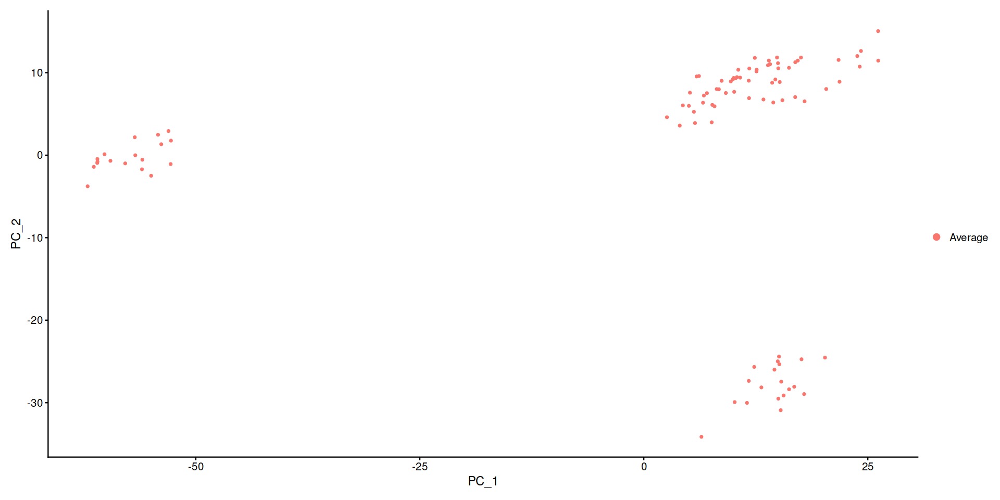

In [52]:
DimPlot(cd4_samples)

In [53]:
cd4_samples$Sample_char  <- colnames(cd4_samples)

In [54]:
cd4_samples$Sample_char  %>% table

.
    101 Dia T0 1 M Exp18     101 Dia T1 1 M Exp18     102 Dia T0 1 M Exp18 
                       1                        1                        1 
    102 Dia T1 1 M Exp18     103 Dia T0 2 M Exp18     103 Dia T1 2 M Exp18 
                       1                        1                        1 
    104 Dia T0 3 M Exp10     104 Dia T0 3 M Exp18     104 Dia T1 3 M Exp18 
                       1                        1                        1 
    105 Dia T0 1 M Exp10     105 Dia T0 1 M Exp18     105 Dia T1 1 M Exp18 
                       1                        1                        1 
    106 Dia T0 1 F Exp10     106 Dia T0 1 F Exp18     106 Dia T1 1 F Exp18 
                       1                        1                        1 
    107 Dia T0 1 M Exp11     107 Dia T0 1 M Exp18     107 Dia T1 1 M Exp18 
                       1                        1                        1 
    108 Dia T0 2 F Exp10     108 Dia T0 2 F Exp18     108 Dia T1 2 F Exp18 
          

In [55]:
cd4_samples@meta.data  <- cd4_samples@meta.data  %>% separate(Sample_char, 
                                                              into = c("Patient_ID",
                                                                      "Disease",
                                                                      "Time",
                                                                      "Age_group",
                                                                      "Sex",
                                                                      "Exp"), 
                                                             sep = " ",
                                                             remove = F)

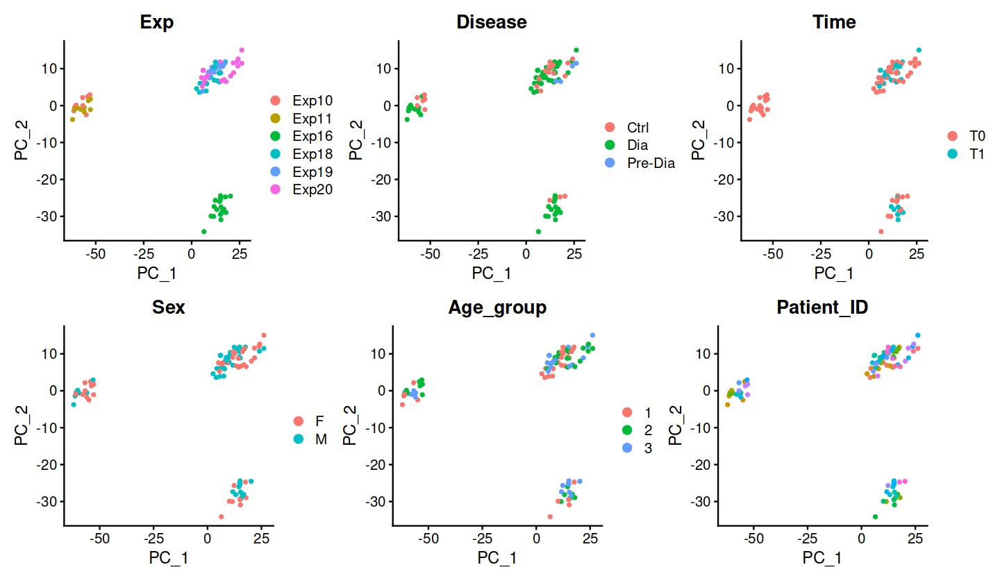

In [56]:
options(repr.plot.width = 12, repr.plot.height = 7)
(DimPlot(cd4_samples, group.by = "Exp") + DimPlot(cd4_samples, group.by = "Disease") + DimPlot(cd4_samples, group.by = "Time")) / (DimPlot(cd4_samples, group.by = "Sex") + DimPlot(cd4_samples, group.by = "Age_group") + (DimPlot(cd4_samples, group.by = "Patient_ID") + NoLegend()))

In [57]:
p1  <- (DimPlot(cd4_samples, group.by = "Exp") + DimPlot(cd4_samples, group.by = "Disease") + DimPlot(cd4_samples, group.by = "Time")) / (DimPlot(cd4_samples, group.by = "Sex") + DimPlot(cd4_samples, group.by = "Age_group") + (DimPlot(cd4_samples, group.by = "Patient_ID") + NoLegend()))



## STACAS Integration over Experiment

In [58]:
merged.list  <- SplitObject(new_dia_cd4, split.by = "Experiment_ID")

In [59]:
plan("sequential")

In [60]:
# normalize and identify variable features for each dataset independently
merged.list <- lapply(X = merged.list, FUN = function(x) {
    DefaultAssay(x)  <- "RNA"
    x$barcode  <- colnames(x)
    x <- NormalizeData(x)
    x <- FindVariableFeatures(x, selection.method = "vst", nfeatures = 2000)
})

library(STACAS)

new_dia_experiment <- Run.STACAS(merged.list, dims = 1:12)
new_dia_experiment <- RunUMAP(new_dia_experiment, dims = 1:12) 

Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.0 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.8 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.5 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.1 GiB"
Preparing PCA embeddings for objects...

Building integration tree with base dataset: 4

Merging dataset 3 into 4

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 5 into 4 3

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 6 into 4 3 5

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 2 into 1

Extracting anchors for merged samples

Finding 

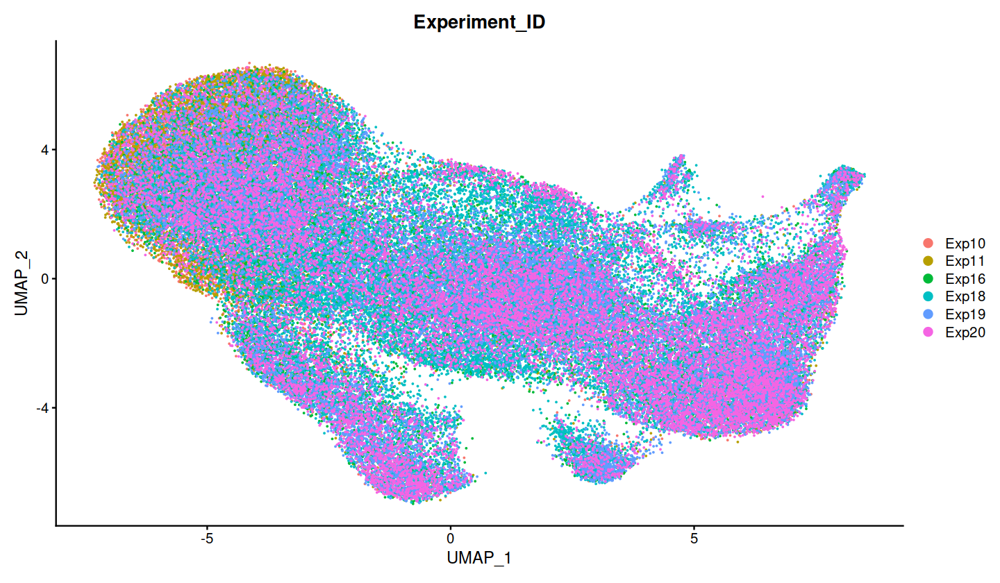

In [61]:
# Visualize

DimPlot(new_dia_experiment, group.by = c("Experiment_ID"))

In [62]:
saveRDS(new_dia_experiment, "data/processed/cd4_full_filt.rds")

# Add metadata

In [63]:
new_dia_experiment  <- readRDS("data/processed/cd4_full_filt.rds")

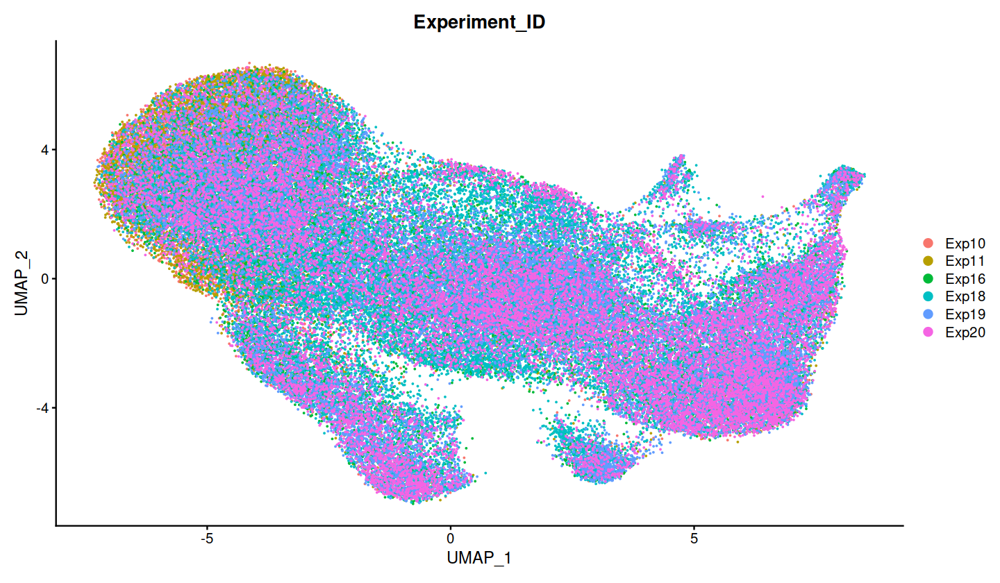

In [64]:
DimPlot(new_dia_experiment, group.by = c("Experiment_ID"))

In [65]:
md_dia  <- read_xlsx("data/dia_metadata2.xlsx")

In [66]:
md_seurat  <- new_dia_experiment@meta.data

In [67]:
md_seurat$Patient_Time  <- paste(md_seurat$Patient_ID, md_seurat$Time)

In [68]:
md_joined  <- left_join(md_seurat, md_dia)

Joining with `by = join_by(Patient_Time)`


In [69]:
new_dia_experiment@meta.data  <- md_joined
rownames(new_dia_experiment@meta.data)  <- colnames(new_dia_experiment)

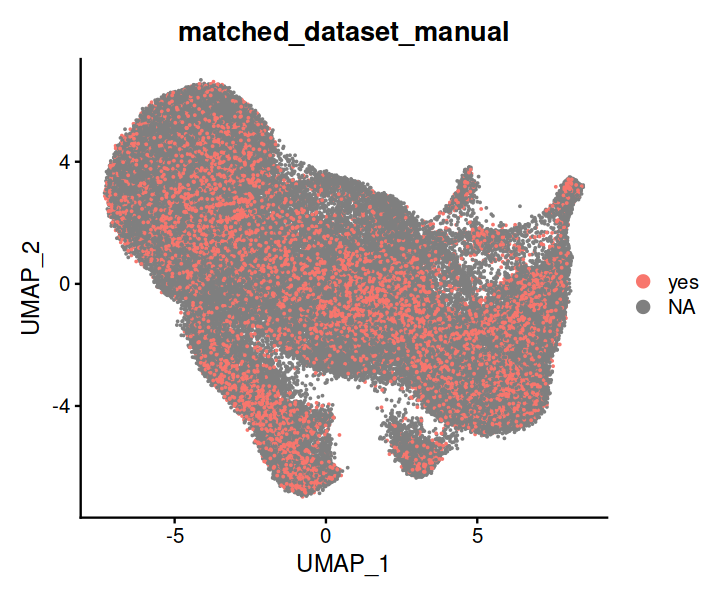

In [70]:
options(repr.plot.width = 6, repr.plot.height = 5)

DimPlot(new_dia_experiment, group.by = "matched_dataset_manual")

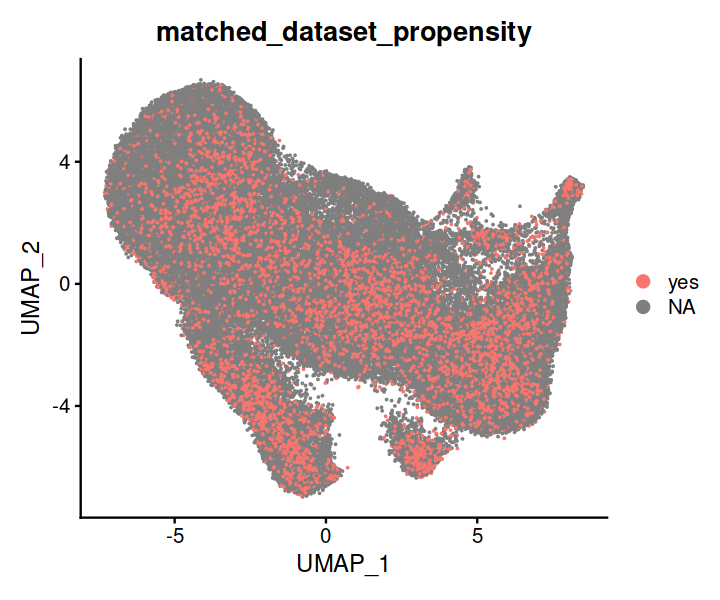

In [71]:
DimPlot(new_dia_experiment, group.by = "matched_dataset_propensity")

In [72]:
saveRDS(new_dia_experiment, "data/processed/cd4_full_filt.rds")

# Analysis CD4 Level 1

In [73]:
new_dia_cd4  <- new_dia_experiment

In [74]:
new_dia_cd4  <- readRDS("data/processed/cd4_full_filt.rds")

In [75]:
DefaultAssay(new_dia_cd4)  <- "integrated"

In [76]:
new_dia_cd4 <- FindNeighbors(new_dia_cd4, dims = 1:12)

Computing nearest neighbor graph

Computing SNN



In [77]:
new_dia_cd4 <- FindClusters(new_dia_cd4, resolution = 0.6)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 87559
Number of edges: 2278826

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8504
Number of communities: 13
Elapsed time: 33 seconds


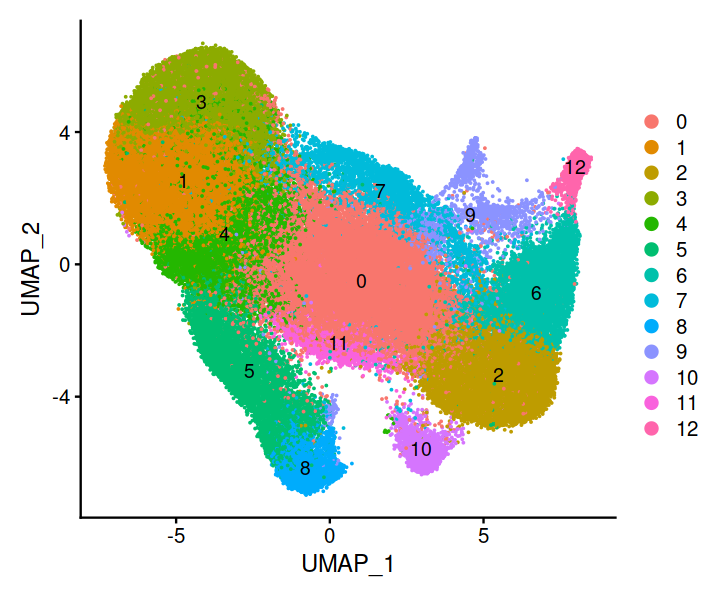

In [78]:
DimPlot(new_dia_cd4, label = T)

In [79]:
new_dia_cd4@meta.data  <- new_dia_cd4@meta.data  %>% 
mutate(annotations_l1 = recode_factor(seurat_clusters, 
                                      "0" = "CD4 T cells",
                                     "1" = "CD4 T cells",
                                     "2" = "CD4 T cells",
                                     "3" = "CD4 T cells",
                                     "4" = "CD4 T cells",
                                     "5" = "CD4 T cells",
                                     "6" = "CD4 T cells",
                                     "7" = "CD4 T cells",
                                     "8" = "CD4 T cells",
                                     "9" = "CD4 T cells",
                                     "10" = "Unconventional T cells",
                                     "11" = "CD4 T cells",
                                     "12" = "CD4 T cells"))

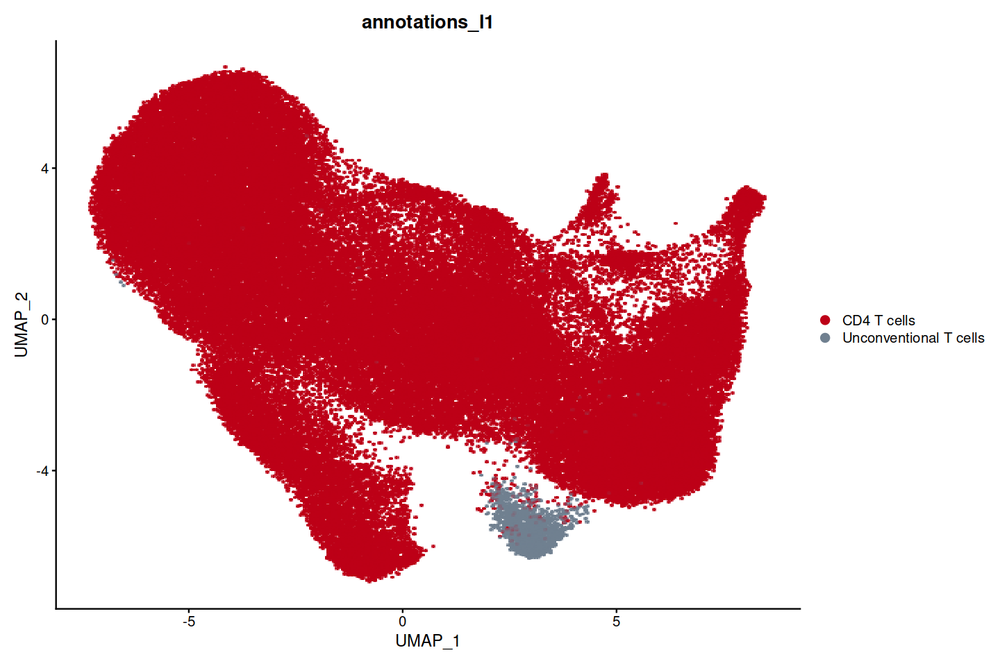

In [80]:
options(repr.plot.width = 12, repr.plot.height = 8)

DimPlot(new_dia_cd4, group.by = "annotations_l1", raster = T, pt.size = 2, 
       cols = c("#BD0017", "slategray"))

In [81]:
saveRDS(new_dia_cd4, "data/processed/cd4_full_filt.rds")

### PCA on samples

In [82]:
cd4_samples  <- AverageExpression(new_dia_cd4, group.by = "Sample_char", return.seurat = T)

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from prediction.score.celltype.l1_ to predictionscorecelltypel1_"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from prediction.score.celltype.l2_ to predictionscorecelltypel2_"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from prediction.score.celltype.l3_ to predictionscorecelltypel3_"
Centering and scaling data matrix



In [83]:
cd4_samples  <- FindVariableFeatures(cd4_samples)

In [84]:
cd4_samples  <- RunPCA(cd4_samples)

Warning message in irlba(A = t(x = object), nv = npcs, ...):
"You're computing too large a percentage of total singular values, use a standard svd instead."
PC_ 1 
Positive:  ACTN1, CD7, NUCB2, AIF1, FCGRT, LRRN3, FHIT, MARCKSL1, NOSIP, SLC25A5 
	   AK5, BACH2, CHI3L2, STMN1, SATB1, PECAM1, CCR7, NOG, NET1, SELL 
	   TRBC2, SERPINE2, ADTRP, ATP5MC3, AP2S1, CORO1A, LAIR1, HMGB1, CRTAM, CELA1 
Negative:  ITGB1, SYNE2, AHNAK, PREX1, MAF, FLNA, ACTN4, MYO1F, EIF3A, IQGAP2 
	   ANXA5, NIBAN1, CAST, RORA, PHACTR2, PHTF2, ANXA2, ADAM19, IL10RA, CAPN2 
	   EZR, TLN1, AHR, FAS, SYT11, SPTAN1, CD58, OGDH, TNFRSF1B, TNFRSF4 
PC_ 2 
Positive:  PRDX1, GIMAP4, CLTA, HNRNPF, EMP3, S100A6, SIT1, VIM, GNG5, RAN 
	   TPI1, LPAR6, CYBA, S100A11, PSMA5, CD40LG, ARPC5, S100A10, PRDX3, NDUFB3 
	   PTTG1IP, PLP2, FKBP2, ACTR3, CDK2AP2, PYCARD, MYL6, SEC61B, PGAM1, S1PR4 
Negative:  TNFAIP3, RGS1, SLC2A3, CD69, NR4A2, JUNB, NFKBIZ, AREG, ZBTB10, JUN 
	   BTG2, HOOK2, DUSP2, CD55, CSRNP1, SGK1, GADD45A, AP3M2,

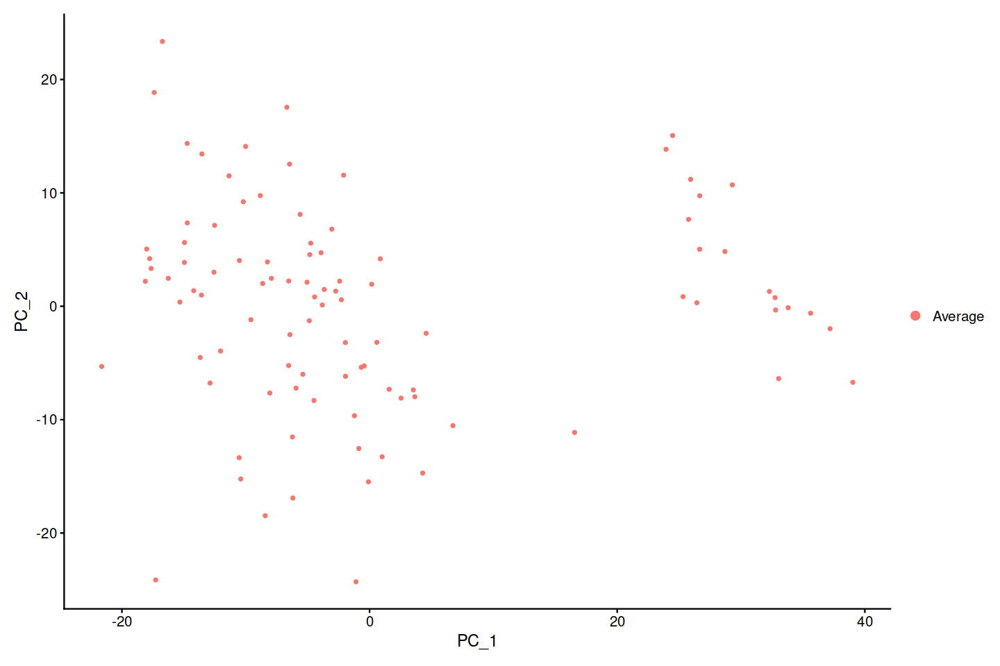

In [85]:
DimPlot(cd4_samples)

In [86]:
cd4_samples$Sample_char  <- colnames(cd4_samples)

In [87]:
cd4_samples@meta.data  <- cd4_samples@meta.data  %>% separate(Sample_char, 
                                                              into = c("Patient_ID",
                                                                      "Disease",
                                                                      "Time",
                                                                      "Age_group",
                                                                      "Sex",
                                                                      "Exp"), 
                                                             sep = " ",
                                                             remove = F)

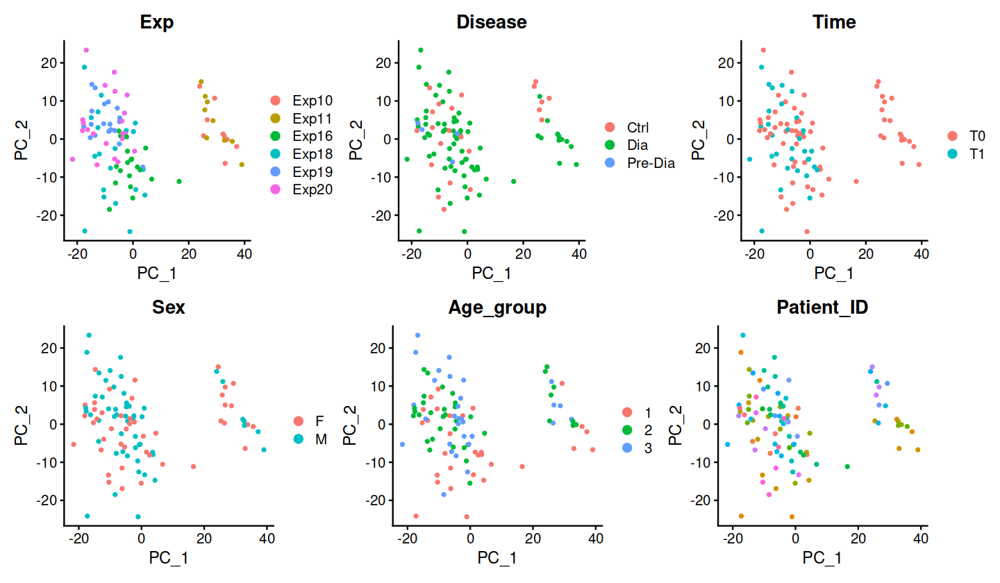

In [88]:
options(repr.plot.width = 12, repr.plot.height = 7)
(DimPlot(cd4_samples, group.by = "Exp") + DimPlot(cd4_samples, group.by = "Disease") + DimPlot(cd4_samples, group.by = "Time")) / (DimPlot(cd4_samples, group.by = "Sex") + DimPlot(cd4_samples, group.by = "Age_group") + (DimPlot(cd4_samples, group.by = "Patient_ID") + NoLegend()))

In [89]:
p2  <- (DimPlot(cd4_samples, group.by = "Exp") + DimPlot(cd4_samples, group.by = "Disease") + DimPlot(cd4_samples, group.by = "Time")) / (DimPlot(cd4_samples, group.by = "Sex") + DimPlot(cd4_samples, group.by = "Age_group") + (DimPlot(cd4_samples, group.by = "Patient_ID") + NoLegend()))

In [90]:
p3  <-  p1  + plot_annotation(title = 'CD4',
                                           subtitle = 'PCA no integration',
                              theme = theme(plot.title = element_text(size = 12))) & ggtheme()

In [91]:
p4  <- p2 + plot_annotation(title = "CD4", subtitle = 'PCA integration STACAS', 
                              theme = theme(plot.title = element_text(size = 10))) & ggtheme()

In [92]:
plot2  <- cowplot::plot_grid(p3,p4, ncol = 1)

In [93]:
ggsave(filename="01_PCA_integration_CD4.pdf", 
       plot = plot2, 
       device = cairo_pdf, 
       width = 210, 
       height = 297, 
       units = "mm")

# Analysis CD4 Level 2

In [94]:
new_dia_cd4  <- readRDS("data/processed/cd4_full_filt.rds")

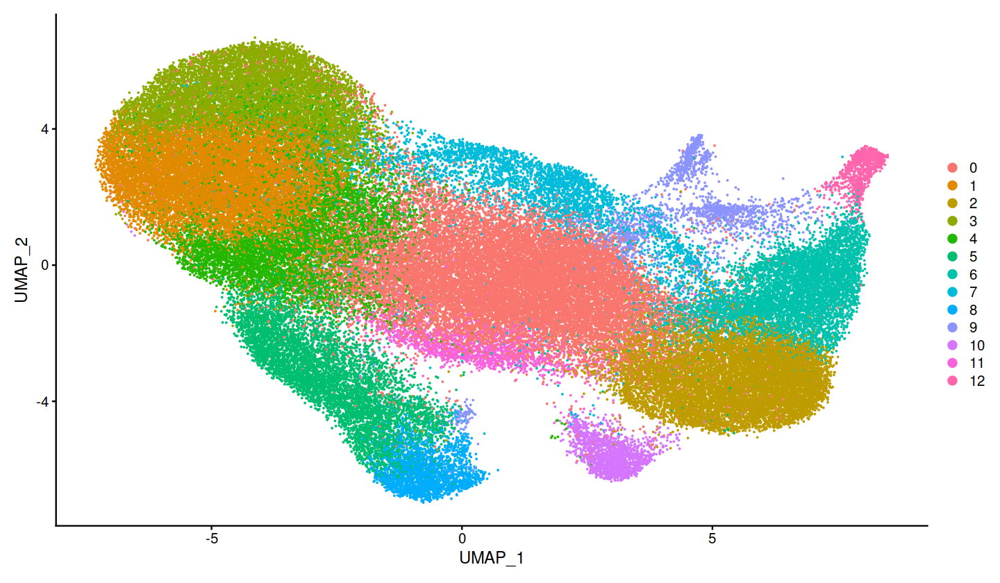

In [95]:
DimPlot(new_dia_cd4)

In [96]:
merged.list  <- SplitObject(subset(new_dia_cd4, annotations_l1 == "CD4 T cells"), split.by = "Experiment_ID")

In [97]:
# normalize and identify variable features for each dataset independently
merged.list <- lapply(X = merged.list, FUN = function(x) {
    DefaultAssay(x)  <- "RNA"
    x$barcode  <- colnames(x)
    x <- NormalizeData(x)
    x <- FindVariableFeatures(x, selection.method = "vst", nfeatures = 2000)
})

In [98]:
new_dia_experiment <- Run.STACAS(merged.list, dims = 1:15)
new_dia_experiment <- RunUMAP(new_dia_experiment, dims = 1:15)

Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.0 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.7 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.4 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.1 GiB"
Preparing PCA embeddings for objects...

Building integration tree with base dataset: 5

Merging dataset 3 into 5

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 4 into 5 3

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 6 into 5 3 4

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 2 into 1

Extracting anchors for merged samples

Finding 

In [99]:
cd4_subcluster <- FindNeighbors(new_dia_experiment, reduction = "pca", dims = 1:15)

Computing nearest neighbor graph

Computing SNN



In [123]:
DefaultAssay(cd4_subcluster)  <- "integrated"

In [131]:
cd4_subcluster <- FindClusters(cd4_subcluster, resolution = 0.6)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 85878
Number of edges: 2151313

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8450
Number of communities: 14
Elapsed time: 28 seconds


1 singletons identified. 13 final clusters.

Warning message:
"UNRELIABLE VALUE: One of the 'future.apply' iterations ('future_lapply-1') unexpectedly generated random numbers without declaring so. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'future.seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'future.seed = NULL', or set option 'future.rng.onMisuse' to "ignore"."


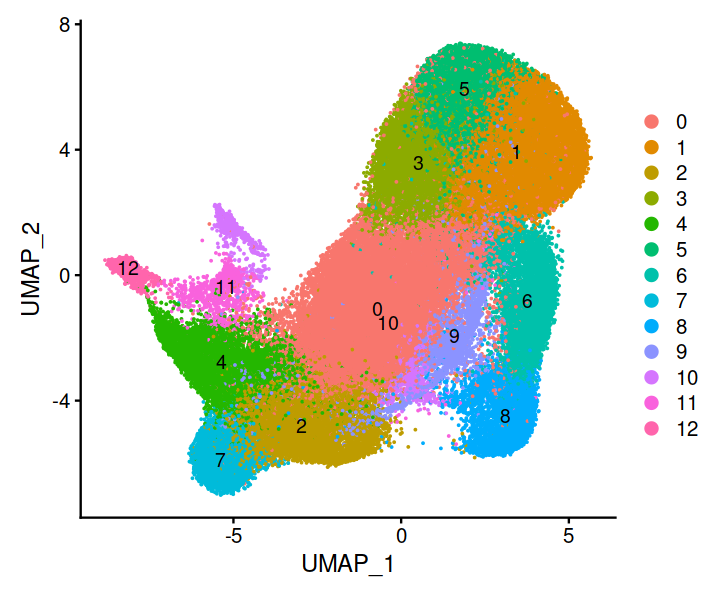

In [132]:
options(repr.plot.width = 6, repr.plot.height = 5)

DimPlot(cd4_subcluster, label = T)

In [103]:
DefaultAssay(cd4_subcluster)  <- "RNA"

`summarise()` has grouped output by 'Sample_ID'. You can override using the
`.groups` argument.
Joining with `by = join_by(Sample_ID)`
Warning message in geom_jitter(binaxis = "y", position = position_jitter(width = 0.1, :
"Ignoring unknown parameters: `binaxis` and `stackdir`"
Bin width defaults to 1/30 of the range of the data. Pick better value with
`binwidth`.


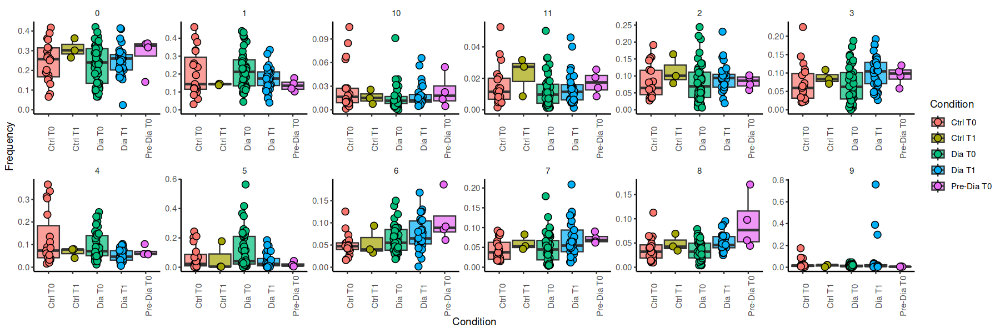

In [108]:
options(repr.plot.width = 15, repr.plot.height = 5)

seurat_meta_data <- cd4_subcluster@meta.data

# Create grouped dataframe, calculate the frequencies of clusters
df4 <- seurat_meta_data %>% 
  group_by(Sample_ID, seurat_clusters) %>% 
  summarise(n = n()) %>% 
  unique() %>% 
  mutate(freq = n / sum(n))  %>% 
dplyr::select(-n)  %>% 
ungroup   %>% 
pivot_wider(names_from = "seurat_clusters", values_from = "freq", values_fill = 0)   %>% 
pivot_longer(!Sample_ID, values_to = "freq", names_to = "seurat_clusters")
# Control - all sums should be one
# df4 %>% group_by(Sample_ID) %>% summarise(sum = sum(freq))

# As we've lost non-grouping variables, let's join them back
md_to_join <- seurat_meta_data %>% 
  dplyr::select(Sample_ID, Condition, Disease, Sex, Age, Age_group, Patient_ID, Time, Experiment_ID) %>% 
  unique()

df4  <- left_join(df4, md_to_join)

# The final plot

df4 %>% 
  ggplot(aes(x = Condition, y = freq)) + # you can change the x to whatever variable you're interested in
  geom_boxplot(outlier.shape = NA, 
           alpha = 0.7, width = 0.9, aes(fill = Condition)) +
   geom_dotplot(binaxis='y', stackdir='center', dotsize=0) + 
   geom_jitter(binaxis='y', position=position_jitter(width = 0.1, height = 0), 
  size = 3, shape = 21, stackdir='center', aes(fill = Condition), color = "black") + 
  facet_wrap(~seurat_clusters, scales = "free", ncol = 6) +
  ylab("Frequency") +
  xlab("Condition") +
  theme_classic() +
 ylim(0,NA) +
  theme(strip.background = element_blank(), panel.grid = element_blank()) + 
  theme(axis.text.x = element_text(angle = 90))

Warning message in geom_jitter(binaxis = "y", position = position_jitter(width = 0.2, :
"Ignoring unknown parameters: `binaxis` and `stackdir`"
Bin width defaults to 1/30 of the range of the data. Pick better value with
`binwidth`.


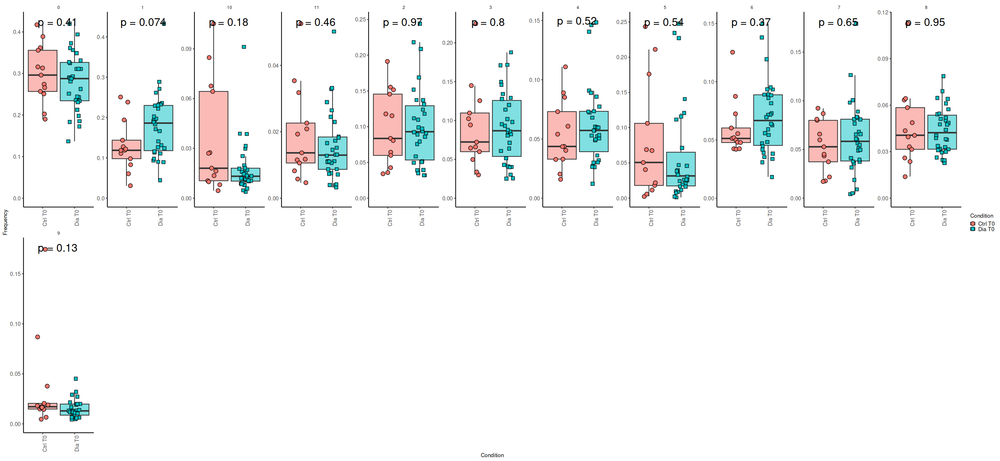

In [109]:
options(repr.plot.width = 26, repr.plot.height = 12)

df4 %>% 
filter(Condition %in% c("Ctrl T0", "Dia T0") & Experiment_ID %in% c("Exp16", "Exp18", "Exp19", "Exp20"))  %>% 
  ggplot(aes(x = Condition, y = freq)) + # you can change the x to whatever variable you're interested in
  geom_boxplot(outlier.shape = NA, 
           alpha = 0.5, width = 0.9, aes(fill = Condition)) +
   geom_dotplot(binaxis='y', stackdir='center', dotsize=0) + 
   geom_jitter(binaxis='y', position=position_jitter(width = 0.2, height = 0), 
  size = 3, stackdir='center', aes(fill = Condition, shape = Condition), color = "black") + 
  facet_wrap(~seurat_clusters, scales = "free", ncol = 11) +
scale_shape_manual(values = c(21,22))+
  ylab("Frequency") +
  xlab("Condition") +
  theme_classic() +
ggtheme() +
ggpubr::stat_compare_means(label.x= 1.1, label.y.npc = 1, size = 7.025, vjust = 0.3, label = "p.format")+
 ylim(0,NA) +
  theme(strip.background = element_blank(), panel.grid = element_blank()) + 
  theme(axis.text.x = element_text(angle = 90))

Warning message in geom_jitter(binaxis = "y", position = position_jitter(width = 0.2, :
"Ignoring unknown parameters: `binaxis` and `stackdir`"
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Bin width defaults to 1/30 of the range of the data. Pick better value with
`binwidth`.


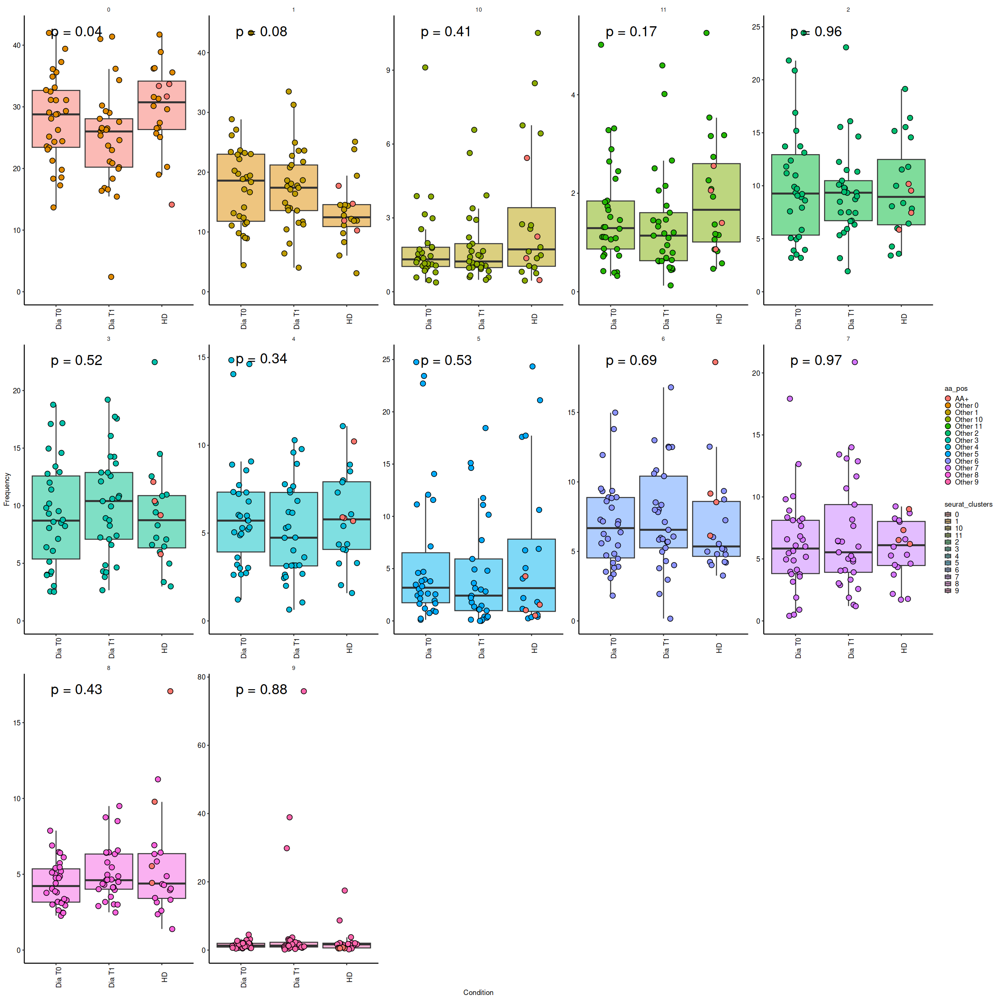

In [110]:
options(repr.plot.width = 20, repr.plot.height = 20)
df4 %>% 
mutate(Condition2 = if_else(Disease %in% c("Ctrl", "Pre-Dia"), "HD", Condition))  %>% 
 mutate(aa_pos = if_else(Disease %in% c("Pre-Dia"), "AA+", paste("Other", seurat_clusters)))  %>% 
filter(Experiment_ID %in% c("Exp16", "Exp18", "Exp19", "Exp20"))  %>% 
  ggplot(aes(x = Condition2, y = freq*100)) + # you can change the x to whatever variable you're interested in
  geom_boxplot(outlier.shape = NA, 
           alpha = 0.5, width = 0.9, aes(fill = seurat_clusters)) +
  new_scale_fill() +
  geom_dotplot(binaxis='y', stackdir='center', dotsize=0) + 
  geom_jitter(binaxis='y', position=position_jitter(width = 0.2, height = 0), 
  size = 3, stackdir='center', aes(fill = aa_pos), color = "black", shape = 21) + 
  facet_wrap(~seurat_clusters, scales = "free", ncol = 5) +
  ylab("Frequency") +
  xlab("Condition") +
  theme_classic() +
ylim(0,NA) +
ggtheme() +
ggpubr::stat_compare_means(label.x= 1.1, label.y.npc = 1, size = 7.025, vjust = 0.3, label = "p.format")+
  theme(strip.background = element_blank(), panel.grid = element_blank()) + 
  theme(axis.text = element_text(color = "black"),
        axis.line = element_line(color = "black"),
        axis.text.x = element_text(angle = 90))

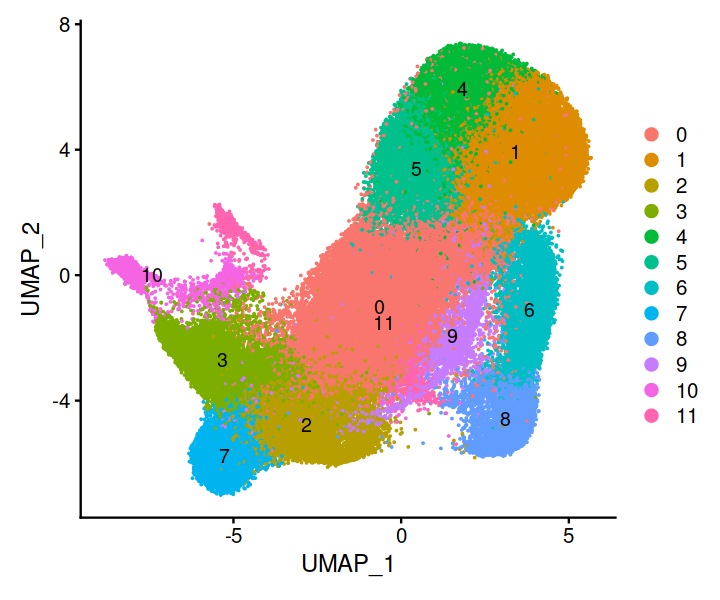

In [111]:
options(repr.plot.width = 6, repr.plot.height = 5)

DimPlot(cd4_subcluster, label = T)

In [112]:
cd4_subcluster@meta.data  <- cd4_subcluster@meta.data  %>% 
mutate(annotations_l2 = recode_factor(seurat_clusters, "0" = "Tfh",
                                     "1" = "Naive",
                                     "2" = "Th1",
                                     "3" = "Naive",
                                     "4" = "Tcm",
                                     "5" = "Naive",
                                     "6" = "Th1/Th17",
                                     "7" = "Treg naive",
                                     "8" = "ISAGhi",
                                     "9" = "Treg memory",
                                     "10" = "Tfh",
                                     "11" = "Proliferating",
                                     "12" = "Th2",
                                     "13" = "Temra"))

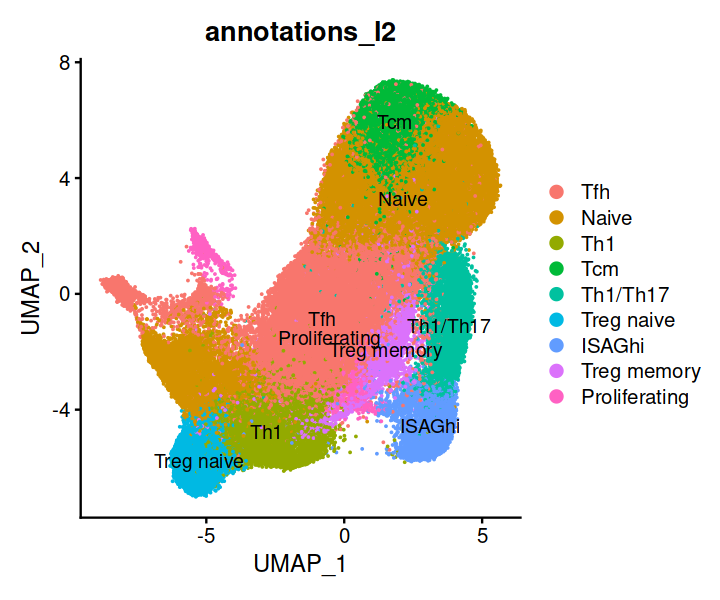

In [113]:
DimPlot(cd4_subcluster, label = T, group.by = "annotations_l2")

In [114]:
plan("multisession")

In [115]:
mrk  <- FindAllMarkers(cd4_subcluster, logfc.threshold = log(1.5))

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11



In [116]:
write.csv(mrk, "markers_cd4_full.csv")

In [117]:
saveRDS(cd4_subcluster, "data/processed/cd4_subcluster.rds")

In [118]:
Idents(cd4_subcluster)  <- cd4_subcluster$annotations_l2

In [119]:
mrk  <- FindAllMarkers(cd4_subcluster, logfc.threshold = log(1.5))

Calculating cluster Tfh

Calculating cluster Naive

Calculating cluster Th1

Calculating cluster Tcm

Calculating cluster Th1/Th17

Calculating cluster Treg naive

Calculating cluster ISAGhi

Calculating cluster Treg memory

Calculating cluster Proliferating



In [120]:
write.csv(mrk, "markers_cd4_full_annot_l2.csv")

In [121]:
Idents(cd4_subcluster)  <- cd4_subcluster$Disease

mrk  <- FindAllMarkers(subset(cd4_subcluster, Experiment_ID %in% c("Exp16", "Exp18", "Exp19", "Exp20") & 
                              Time == "T0" &
                              Disease %in% c("Dia", "Ctrl")))

write.csv(mrk, "markers_cd4_dia_vs_hd_t0.csv")

Calculating cluster Dia

Calculating cluster Ctrl



### Cluster tree

In [ ]:
DimPlot(cd4_subcluster, label = T)

In [ ]:
cd4_subcluster <- BuildClusterTree(
  cd4_subcluster,
  dims = 1:12,
  reorder = FALSE,
  reorder.numeric = FALSE
)

In [ ]:
tree <- cd4_subcluster@tools$BuildClusterTree
tree$tip.label <- paste0("Cluster ", tree$tip.label)

In [ ]:
install.packages("ggtree")

In [ ]:
library(ggtree)

In [ ]:
p <- ggtree::ggtree(tree, aes(x, y)) +
  scale_y_reverse() +
  ggtree::geom_tree() +
  ggtree::theme_tree() +
  ggtree::geom_tiplab(offset = 1) +
  ggtree::geom_tippoint(color = (scales::hue_pal() (14)), shape = 16, size = 5) +
  coord_cartesian(clip = 'off') +
  theme(plot.margin = unit(c(0,2.5,0,0), 'cm'))

#ggsave('plots/cluster_tree.png', p, height = 4, width = 6)

In [ ]:
options(repr.plot.width=3.5, repr.plot.height=3)
p

In [ ]:
DimPlot(cd4_subcluster)

In [ ]:
FeaturePlot(cd4_subcluster, features = "GZMK", min.cutoff = 0)

In [ ]:
c5  <- readRDS("data/processed/c5.rds")

In [ ]:
options(repr.plot.width = 6, repr.plot.height = 5)

DimPlot(cd4_subcluster, cells.highlight = colnames(c5))

## Analysis Level 3: Treg

In [ ]:
treg <- subset(cd4_subcluster, seurat_clusters %in% c(6,8))

In [ ]:
treg_dia_experiment  <- SplitObject(treg, split.by = "Experiment_ID")

In [ ]:
treg_dia_experiment

In [ ]:
plan("sequential")

In [ ]:
# normalize and identify variable features for each dataset independently
merged.list <- lapply(X = treg_dia_experiment, FUN = function(x) {
    DefaultAssay(x)  <- "RNA"
    x$barcode  <- colnames(x)
    x <- NormalizeData(x)
    x <- FindVariableFeatures(x, selection.method = "vst", nfeatures = 2000)
})

library(STACAS)

treg_dia_experiment <- Run.STACAS(merged.list, dims = 1:12)
treg_dia_experiment <- RunUMAP(treg_dia_experiment, dims = 1:12) 

In [ ]:
# Visualize
options(repr.plot.width = 10, repr.plot.height = 5)

DimPlot(treg_dia_experiment, group.by = c("Monaco_single"))

In [ ]:
treg_dia_experiment  <- FindNeighbors(treg_dia_experiment)
treg_dia_experiment  <- FindClusters(treg_dia_experiment, resolution = 0.5)

### Treg subset annotations

In [ ]:
options(repr.plot.width = 6, repr.plot.height = 5)
DimPlot(treg_dia_experiment, label = T)

In [ ]:
FeaturePlot(treg_dia_experiment, features = "FOXP3", min.cutoff = 0)

In [ ]:
FeaturePlot(treg_dia_experiment, features = "GZMK", min.cutoff = 0)

In [ ]:
options(repr.plot.width = 15, repr.plot.height = 5)

seurat_meta_data <- treg_dia_experiment@meta.data

# Create grouped dataframe, calculate the frequencies of clusters
df4 <- seurat_meta_data %>% 
  group_by(Sample_ID, seurat_clusters) %>% 
  summarise(n = n()) %>% 
  unique() %>% 
  mutate(freq = n / sum(n))  %>% 
dplyr::select(-n)  %>% 
ungroup   %>% 
pivot_wider(names_from = "seurat_clusters", values_from = "freq", values_fill = 0)   %>% 
pivot_longer(!Sample_ID, values_to = "freq", names_to = "seurat_clusters")
# Control - all sums should be one
# df4 %>% group_by(Sample_ID) %>% summarise(sum = sum(freq))

# As we've lost non-grouping variables, let's join them back
md_to_join <- seurat_meta_data %>% 
  dplyr::select(Sample_ID, Condition, Disease, Sex, Age, Age_group, Patient_ID, Time, Experiment_ID) %>% 
  unique()

df4  <- left_join(df4, md_to_join)

# The final plot

df4 %>% 
  ggplot(aes(x = Condition, y = freq)) + # you can change the x to whatever variable you're interested in
  geom_boxplot(outlier.shape = NA, 
           alpha = 0.7, width = 0.9, aes(fill = Condition)) +
   geom_dotplot(binaxis='y', stackdir='center', dotsize=0) + 
   geom_jitter(binaxis='y', position=position_jitter(width = 0.1, height = 0), 
  size = 3, shape = 21, stackdir='center', aes(fill = Condition), color = "black") + 
  facet_wrap(~seurat_clusters, scales = "free", ncol = 6) +
  ylab("Frequency") +
  xlab("Condition") +
  theme_classic() +
 ylim(0,NA) +
  theme(strip.background = element_blank(), panel.grid = element_blank()) + 
  theme(axis.text.x = element_text(angle = 90))

In [ ]:
options(repr.plot.width = 26, repr.plot.height = 12)

df4 %>% 
filter(Condition %in% c("Ctrl T0", "Dia T0") & Experiment_ID %in% c("Exp16", "Exp18", "Exp19", "Exp20"))  %>% 
  ggplot(aes(x = Condition, y = freq)) + # you can change the x to whatever variable you're interested in
  geom_boxplot(outlier.shape = NA, 
           alpha = 0.5, width = 0.9, aes(fill = Condition)) +
   geom_dotplot(binaxis='y', stackdir='center', dotsize=0) + 
   geom_jitter(binaxis='y', position=position_jitter(width = 0.2, height = 0), 
  size = 3, stackdir='center', aes(fill = Condition, shape = Condition), color = "black") + 
  facet_wrap(~seurat_clusters, scales = "free", ncol = 11) +
scale_shape_manual(values = c(21,22))+
  ylab("Frequency") +
  xlab("Condition") +
  theme_classic() +
ggtheme() +
ggpubr::stat_compare_means(label.x= 1.1, label.y.npc = 1, size = 7.025, vjust = 0.3, label = "p.format")+
 ylim(0,NA) +
  theme(strip.background = element_blank(), panel.grid = element_blank()) + 
  theme(axis.text.x = element_text(angle = 90))

In [ ]:
df4$annotations_l2  <- df4$seurat_clusters

In [ ]:
options(repr.plot.width = 25, repr.plot.height = 8)

df4 %>%
filter(Experiment_ID %in% c("Exp16", "Exp18", "Exp19", "Exp20"))  %>% 
mutate(Condition2 = if_else(Disease %in% c("Ctrl", "Pre-Dia"), "HD", Condition))  %>% 
 mutate(aa_pos = if_else(Disease %in% c("Pre-Dia"), "AA+", paste("Other", seurat_clusters)))  %>% 
  ggplot(aes(x = Condition2, y = freq*100)) + # you can change the x to whatever variable you're interested in
  geom_boxplot(outlier.shape = NA, 
           alpha = 0.5, width = 0.9, aes(fill = annotations_l2)) +
  new_scale_fill() +
  geom_dotplot(binaxis='y', stackdir='center', dotsize=0) + 
  geom_jitter(binaxis='y', position=position_jitter(width = 0.2, height = 0), 
  size = 3, stackdir='center', aes(fill = aa_pos, shape = aa_pos), color = "black") +
  
  facet_wrap(~annotations_l2, scales = "free", ncol = 9) +
  ylab("Frequency") +
scale_shape_manual(values = c(16,21,21,21,21,21,21,21,21))+
  xlab("Condition") +
  theme_classic() +
ggtheme() +
ggpubr::stat_compare_means(label.x= 1.1, label.y.npc = 1, size = 7.025, vjust = 0.3, label = "p.format")+
 ylim(0,NA) +
  theme(strip.background = element_blank(), panel.grid = element_blank()) + 
  theme(axis.text = element_text(color = "black"),
        axis.line = element_line(color = "black"),
        axis.text.x = element_text(angle = 90))

In [ ]:
df4 %>%
filter(Experiment_ID %in% c("Exp16", "Exp18", "Exp19", "Exp20") & Time == "T0")  %>% 
mutate(Condition2 = if_else(Disease %in% c("Ctrl", "Pre-Dia"), "HD", Condition))  %>% 
 mutate(aa_pos = if_else(Disease %in% c("Pre-Dia"), "AA+", paste("Other", seurat_clusters)))  %>% 
  ggplot(aes(x = Condition2, y = freq*100)) + # you can change the x to whatever variable you're interested in
  geom_boxplot(outlier.shape = NA, 
           alpha = 0.5, width = 0.9, aes(fill = annotations_l2)) +
  new_scale_fill() +
  geom_dotplot(binaxis='y', stackdir='center', dotsize=0) + 
  geom_jitter(binaxis='y', position=position_jitter(width = 0.2, height = 0), 
  size = 3, stackdir='center', aes(fill = aa_pos, shape = aa_pos), color = "black") +
  
  facet_wrap(~annotations_l2, scales = "free", ncol = 9) +
  ylab("Frequency") +
scale_shape_manual(values = c(16,21,21,21,21,21,21,21,21))+
  xlab("Condition") +
  theme_classic() +
ggtheme() +
ggpubr::stat_compare_means(label.x= 1.1, label.y.npc = 1, size = 7.025, vjust = 0.3, label = "p.format")+
 ylim(0,NA) +
  theme(strip.background = element_blank(), panel.grid = element_blank()) + 
  theme(axis.text = element_text(color = "black"),
        axis.line = element_line(color = "black"),
        axis.text.x = element_text(angle = 90))

## Analysis Level 3: Teffector

In [ ]:
teff <- subset(cd4_subcluster, seurat_clusters %in% c(0,4,10))

In [ ]:
teff

In [ ]:
teff_dia_experiment  <- SplitObject(teff, split.by = "Experiment_ID")

In [ ]:
teff_dia_experiment

In [ ]:
plan("sequential")

In [ ]:
# normalize and identify variable features for each dataset independently
merged.list <- lapply(X = teff_dia_experiment, FUN = function(x) {
    DefaultAssay(x)  <- "RNA"
    x$barcode  <- colnames(x)
    x <- NormalizeData(x)
    x <- FindVariableFeatures(x, selection.method = "vst", nfeatures = 500)
})

library(STACAS)

teff_dia_experiment <- Run.STACAS(merged.list, dims = 1:10)
teff_dia_experiment <- RunUMAP(teff_dia_experiment, dims = 1:10) 

In [ ]:
# Visualize

DimPlot(teff_dia_experiment)

In [ ]:
teff_dia_experiment  <- FindNeighbors(teff_dia_experiment)
teff_dia_experiment  <- FindClusters(teff_dia_experiment, resolution = 0.5)

In [ ]:
DimPlot(teff_dia_experiment, label = T)